# EDA and Statistical Tests

 

In [1]:
import pandas as pd
import numpy as np

df = pd.read_csv("C:/Users/ASUS/Desktop/Parsa/University/ML/bank+marketing/bank/bank-full.csv", delimiter=';')

df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [2]:
# Summary

df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [3]:
# data types

data_types = df.dtypes

print("/nData Types:")
print(data_types)


/nData Types:
age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object



## Numerical Features (e.g., age, balance, duration, etc.):
### Handling Missing Values:

     Check if there are any missing values in the numerical columns.

     If there are, decide on an imputation strategy. You might use the mean, median, or a more sophisticated method like regression imputation based on other   
     features.
### Outlier Detection:

     Examine the distribution of each numerical feature for outliers. You can use statistical methods or visualization techniques like box plots.
     
     Decide whether to remove outliers or transform them (e.g., log transformation).

     

#### Handling Missing Values

In [4]:
# Check for missing values
missing_values = df.isnull().sum()
missing_values

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

Numerical Diatribution

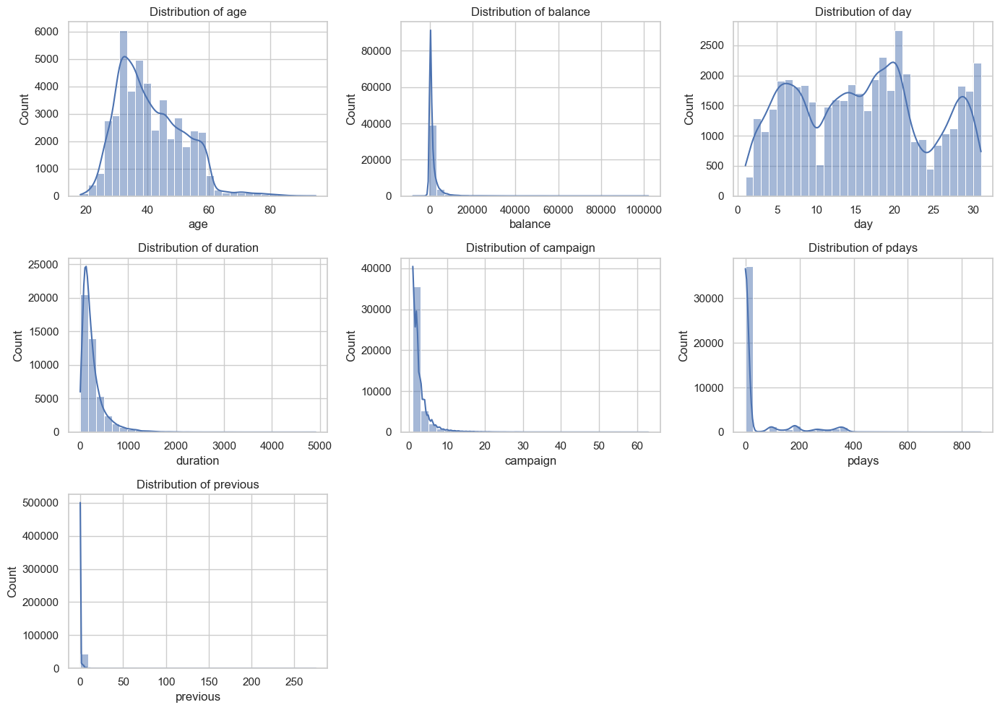

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style and size for the plots
sns.set(style="whitegrid")
plt.figure(figsize=(14, 10))

# List of numerical features
numerical_features = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

# Plot the distribution of numerical features
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(f'Distribution of {feature}')

plt.tight_layout()
plt.show()


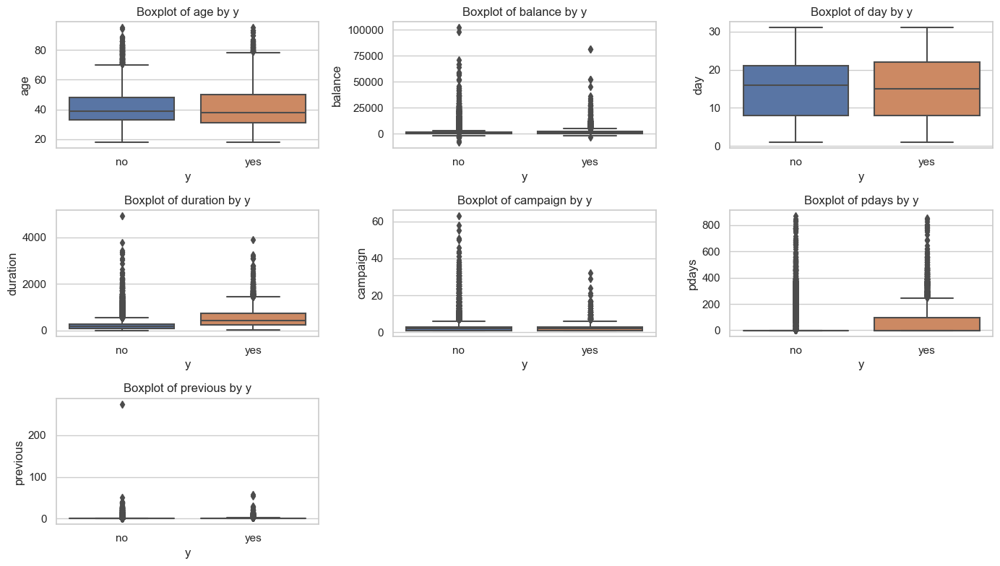

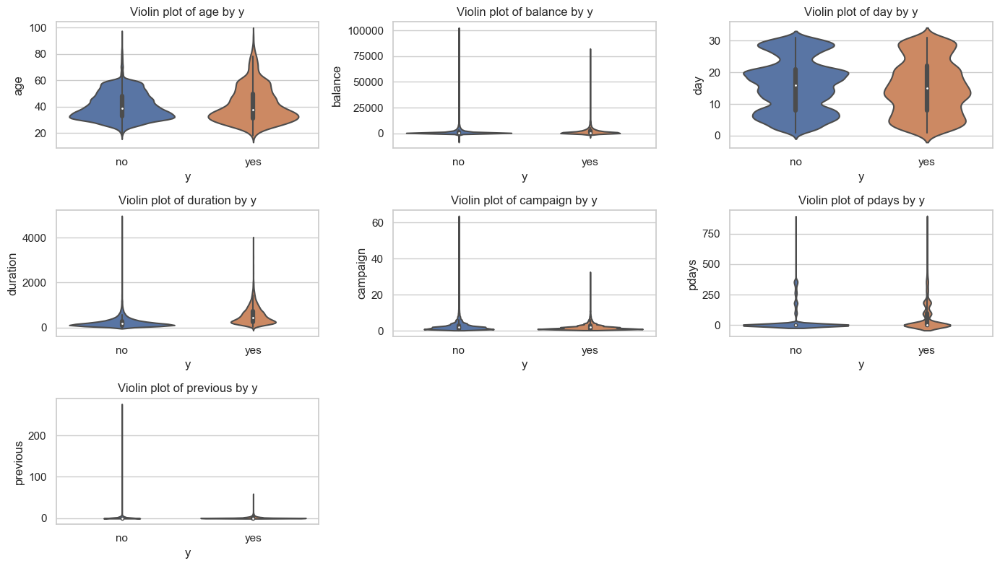

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Selecting numerical columns and the y variable
numerical_columns = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
y_variable = 'y'

# Setting the size of the plot
plt.figure(figsize=(14, 8))

# Creating Boxplot for each numerical column by y variable
for i, column in enumerate(numerical_columns):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(x=y_variable, y=column, data=df)
    plt.title(f'Boxplot of {column} by {y_variable}')

# Displaying the plots
plt.tight_layout()
plt.show()

# Now for creating a Violin plot

# Setting the size of the plot for Violin plot
plt.figure(figsize=(14, 8))

# Creating Violin plot for each numerical column by y variable
for i, column in enumerate(numerical_columns):
    plt.subplot(3, 3, i + 1)
    sns.violinplot(x=y_variable, y=column, data=df)
    plt.title(f'Violin plot of {column} by {y_variable}')

# Displaying the plots
plt.tight_layout()
plt.show()


c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


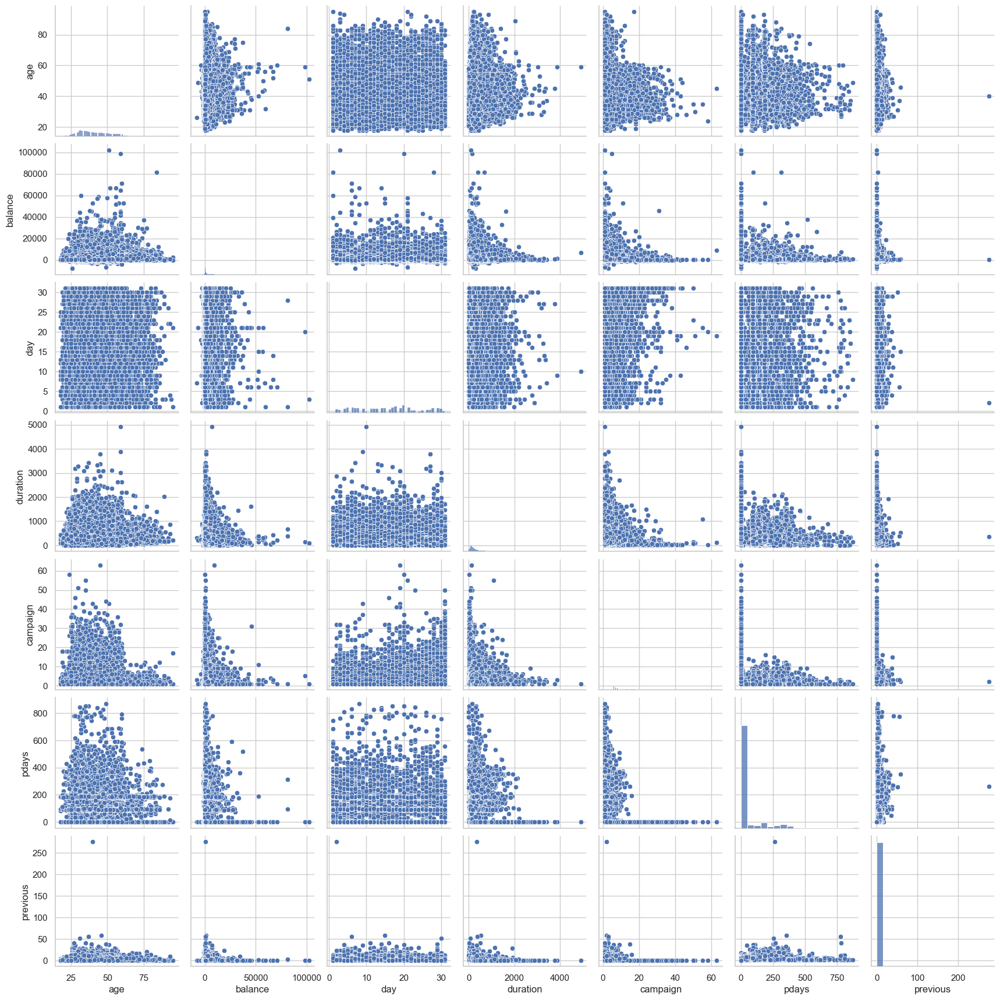

c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


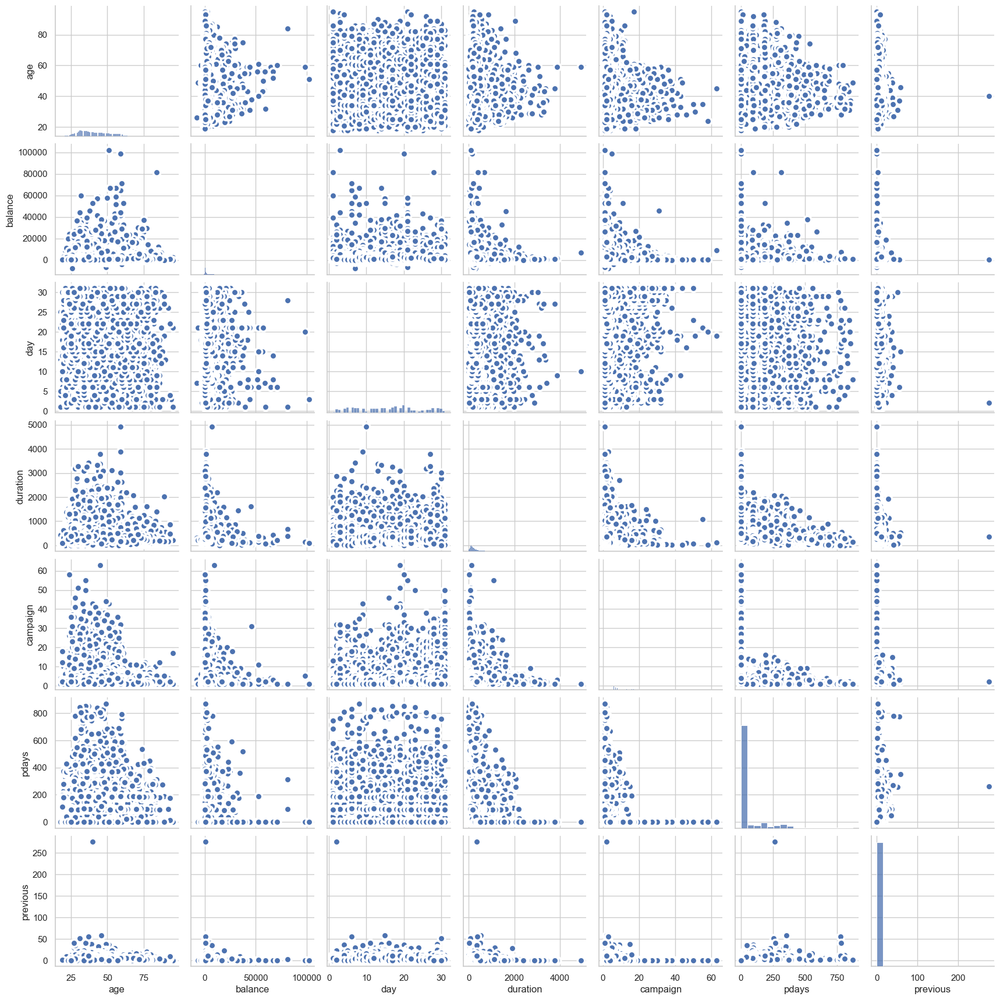

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd




sns.pairplot(df, kind="scatter")
plt.show()

sns.pairplot(df, kind="scatter", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
plt.show()


c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: The markers list has more values (3) than needed (2), which may not be intended.
  func(x=x, y=y, **kwargs)
c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisg

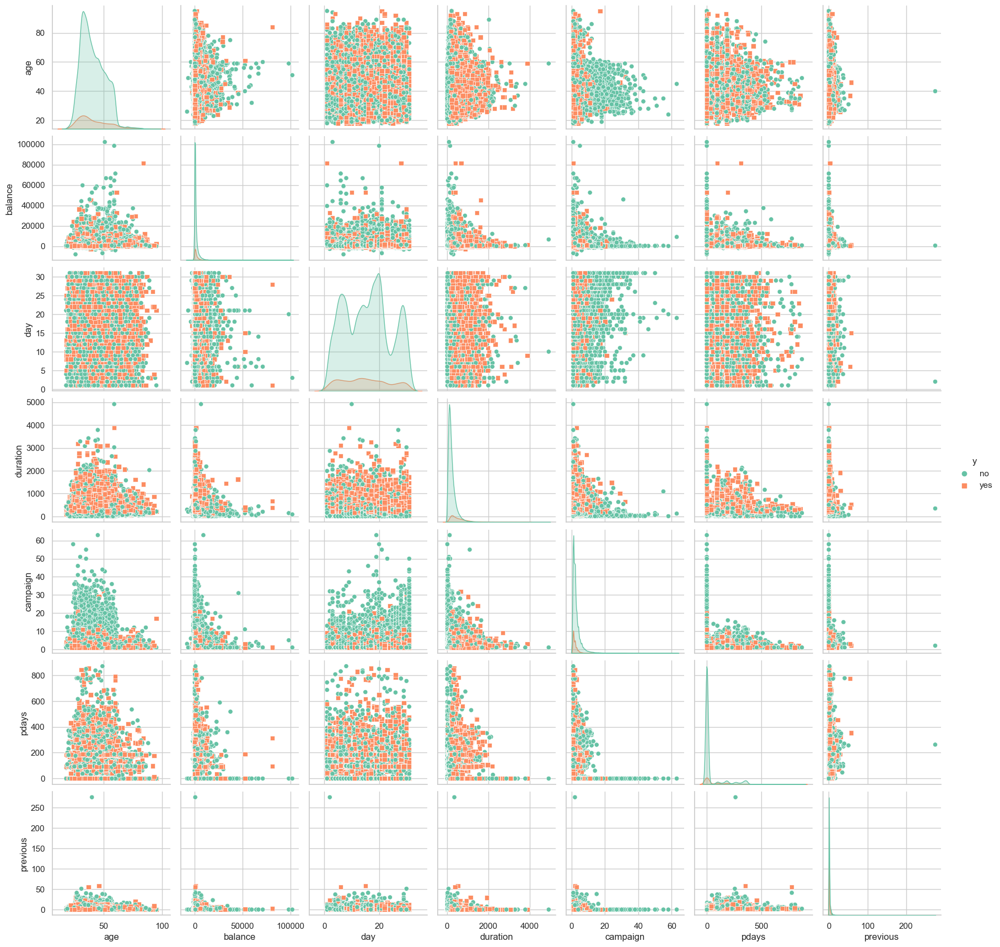

c:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


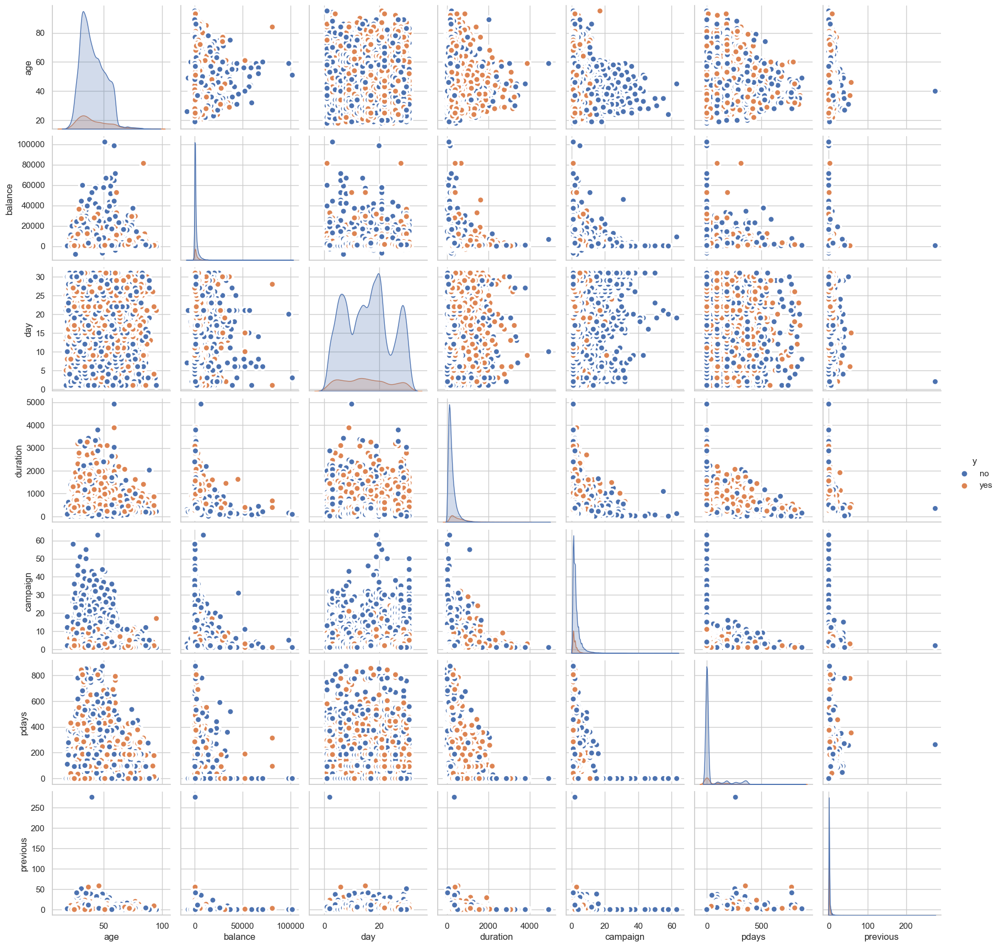

In [8]:
# library & dataset
import matplotlib.pyplot as plt
import seaborn as sns

 
# left
sns.pairplot(df, kind="scatter", hue="y", markers=["o", "s", "D"], palette="Set2")
plt.show()
 
# right: you can give other arguments with plot_kws.
sns.pairplot(df, kind="scatter", hue="y", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
plt.show()

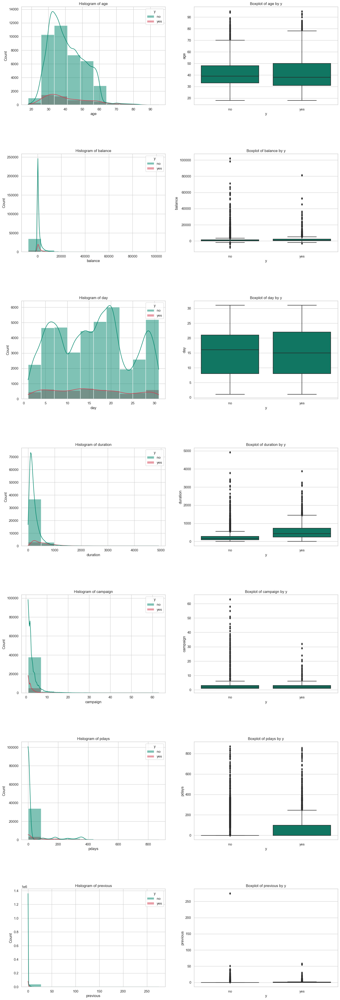

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# تعیین مولفه‌های عددی
numerical_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

# تعریف ابعاد subplot
fig, axes = plt.subplots(len(numerical_cols), 2, figsize=(18, 8*len(numerical_cols)))
plt.subplots_adjust(hspace=0.5)

# بررسی هر مولفه عددی و رسم نمودارهای histogram و boxplot
for i, col in enumerate(numerical_cols):
    # histogram
    sns.histplot(data=df, x=col, bins=10, kde=True, hue='y', multiple='layer', element='bars', palette=['#00876c', '#d43d51'], ax=axes[i, 0])
    axes[i, 0].set_title(f'Histogram of {col}')

    # boxplot
    sns.boxplot(data=df, x='y', y=col, ax=axes[i, 1], palette=['#00876c'])
    axes[i, 1].set_title(f'Boxplot of {col} by y')

plt.show()


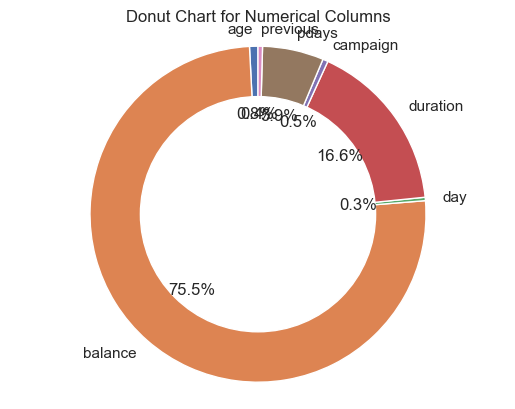

In [10]:
    import matplotlib.pyplot as plt

# مولفه‌های عددی
numerical_cols = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
size_of_groups = [len(df[col].unique()) for col in numerical_cols]

# ساخت نمودار donut
plt.pie(size_of_groups, labels=numerical_cols, autopct='%1.1f%%', startangle=90)

# اضافه کردن یک دایره در مرکز تا آن را به یک نمودار donut تبدیل کند
my_circle = plt.Circle((0, 0), 0.7, color='white')
p = plt.gcf()
p.gca().add_artist(my_circle)

plt.axis('equal')
plt.title('Donut Chart for Numerical Columns')
plt.show()


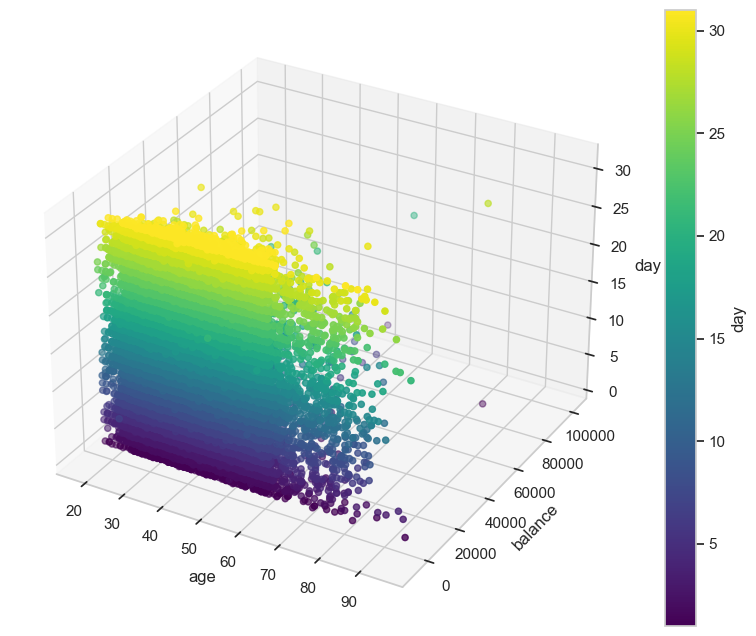

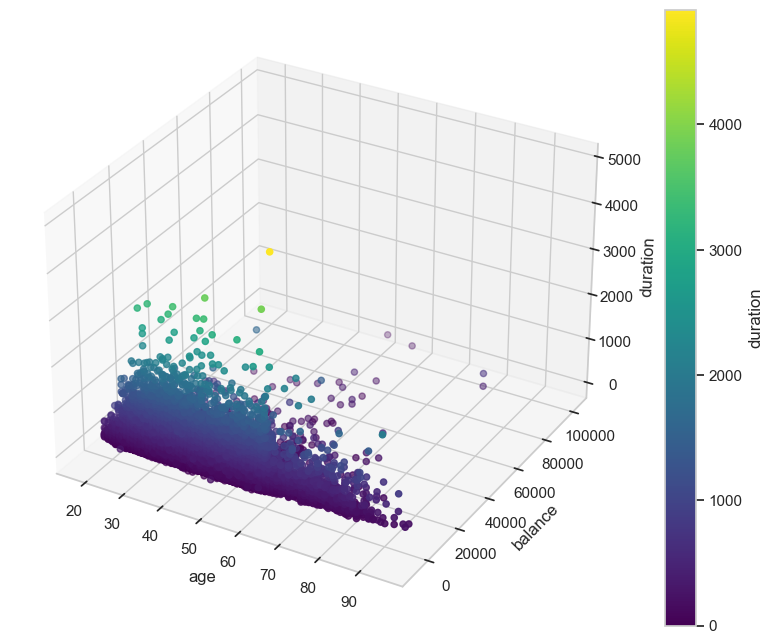

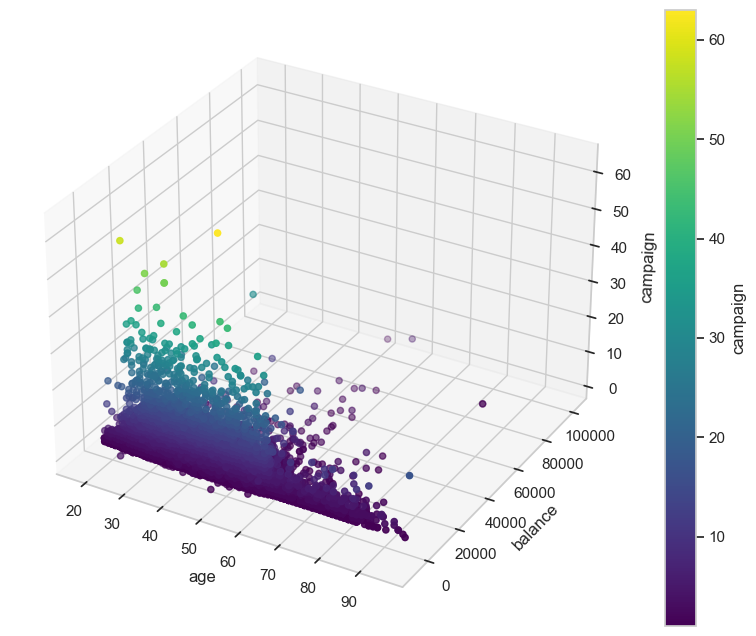

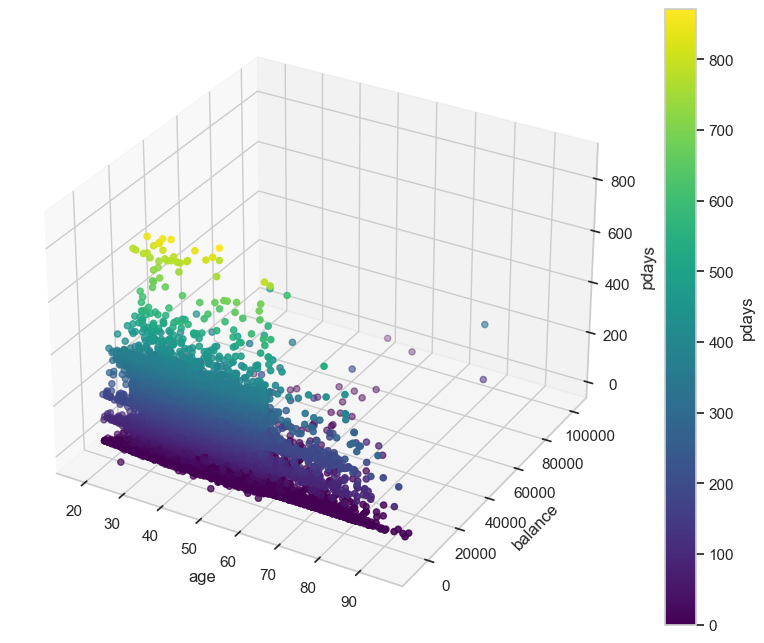

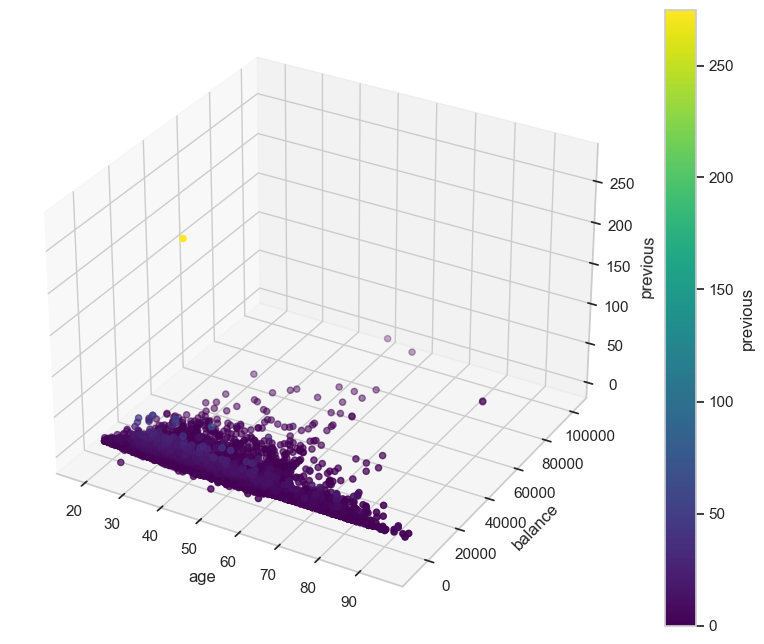

...

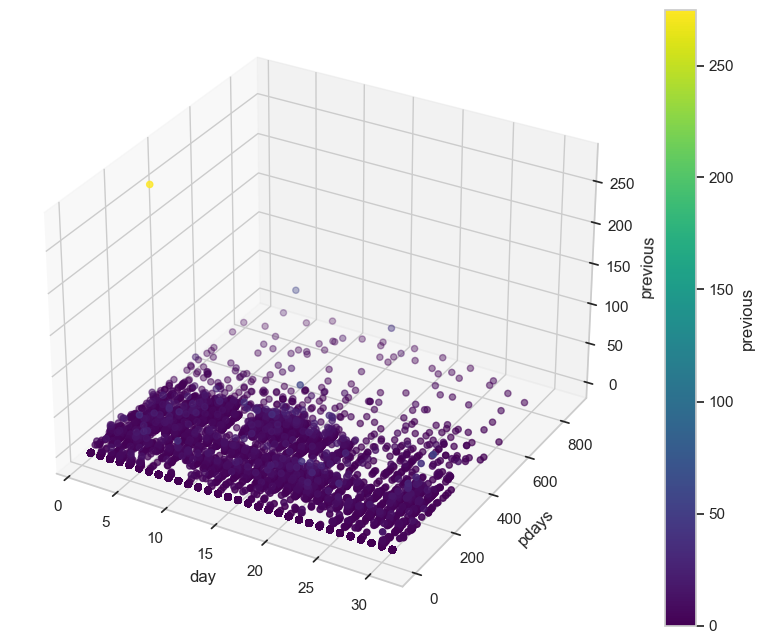

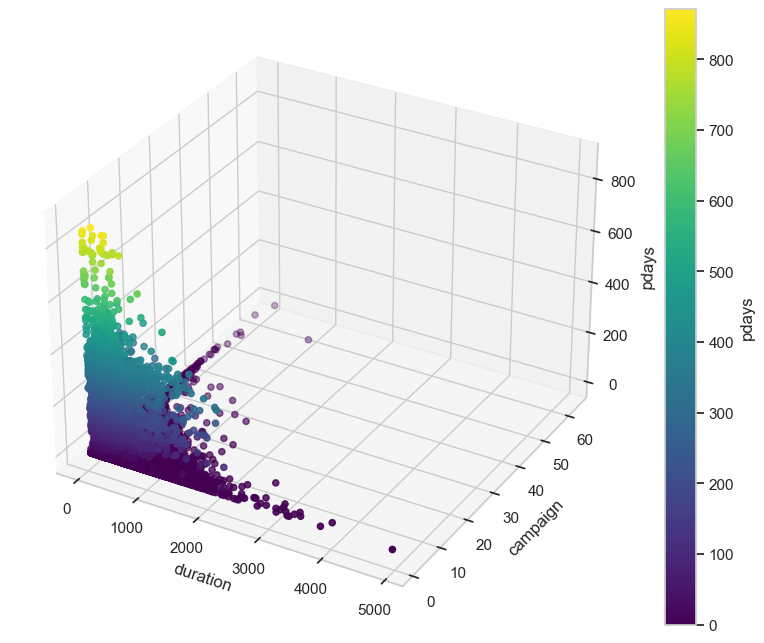

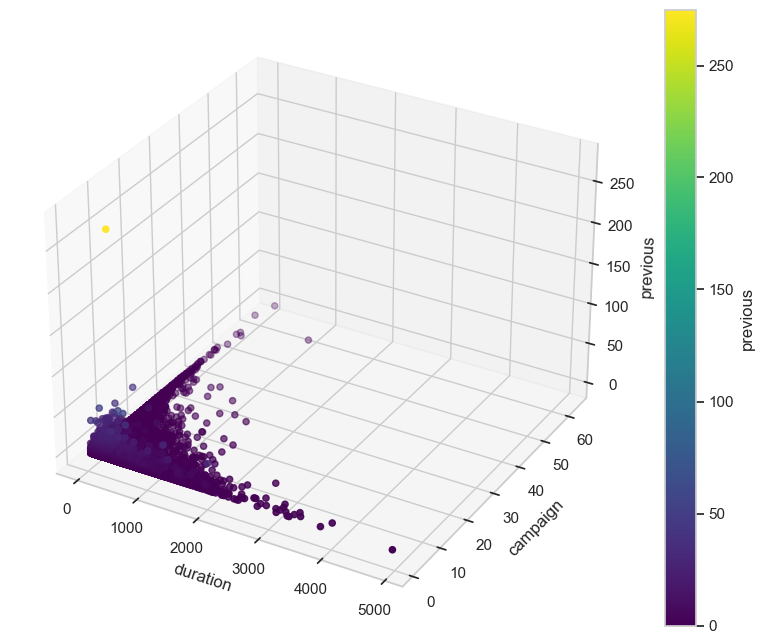

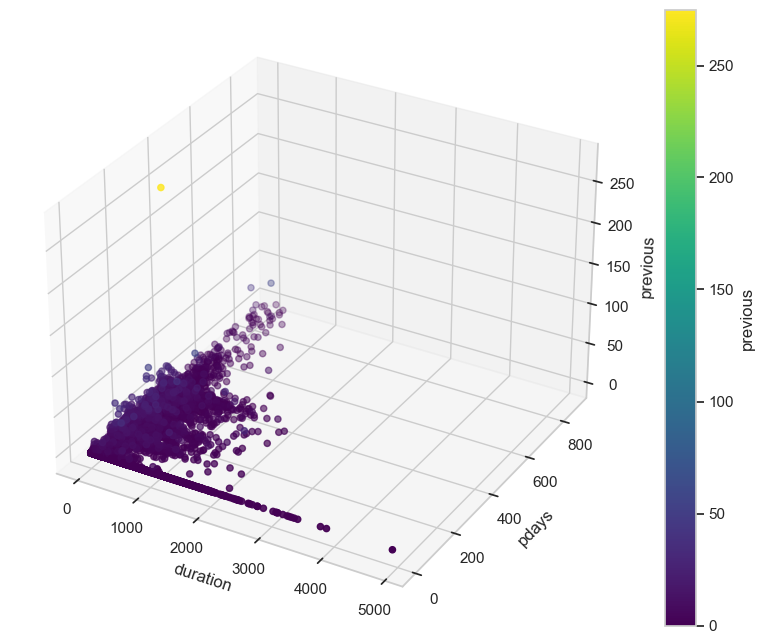

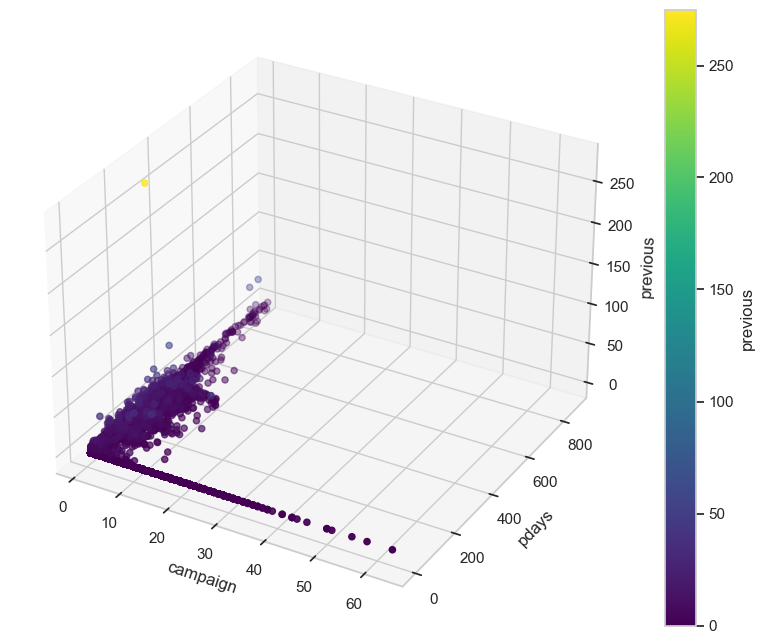

In [11]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# داده‌های عددی
numerical_features = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

# ساخت یک شکل سه‌بعدی برای هر سه‌تایی از ویژگی‌های عددی
for i in range(len(numerical_features) - 2):
    for j in range(i + 1, len(numerical_features) - 1):
        for k in range(j + 1, len(numerical_features)):
            fig = plt.figure(figsize=(10, 8))
            ax = fig.add_subplot(111, projection='3d')
            scatter = ax.scatter(df[numerical_features[i]], df[numerical_features[j]], df[numerical_features[k]], 
                                 c=df[numerical_features[k]], cmap='viridis')
            ax.set_xlabel(numerical_features[i])
            ax.set_ylabel(numerical_features[j])
            ax.set_zlabel(numerical_features[k])
            fig.colorbar(scatter, label=numerical_features[k])
            plt.show()


seems only age and day are close to normal distribution

In [12]:
# find the unique values from categorical features
for col in df.select_dtypes(include='object').columns:
    print(col)
    print(df[col].unique())

job
['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student']
marital
['married' 'single' 'divorced']
education
['tertiary' 'secondary' 'unknown' 'primary']
default
['no' 'yes']
housing
['yes' 'no']
loan
['no' 'yes']
contact
['unknown' 'cellular' 'telephone']
month
['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep']
poutcome
['unknown' 'failure' 'other' 'success']
y
['no' 'yes']


In [13]:
df.replace('unknown', np.nan, inplace=True)

df.isna().sum()

age              0
job            288
marital          0
education     1857
default          0
balance          0
housing          0
loan             0
contact      13020
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
poutcome     36959
y                0
dtype: int64

Text(0.5, 1.0, 'Number of missing entries by passenger')

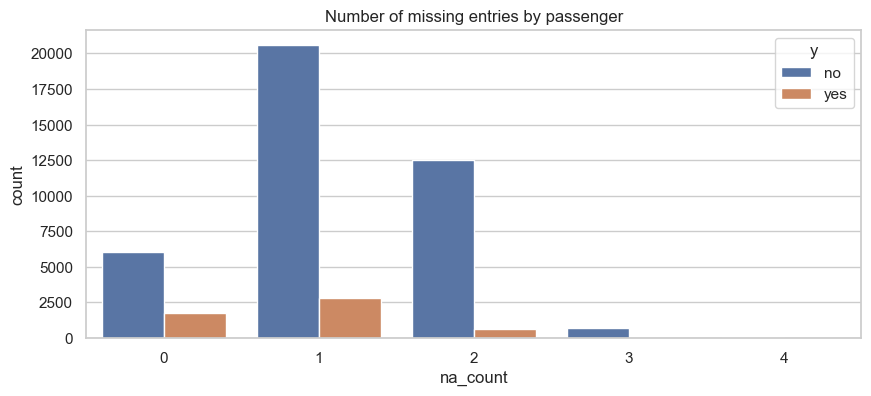

In [14]:
# Countplot of number of missing values by passenger

df['na_count']=df.isna().sum(axis=1)
plt.figure(figsize=(10,4))
sns.countplot(data=df, x='na_count', hue='y')
plt.title('Number of missing entries by passenger')


There isnt too much of one null or two null so we can drop som of them 

There is lots of rows in poutcome that are Non so i drop the coloumn

In [15]:
df = df.drop('poutcome', axis=1)
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,y,na_count
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,no,2
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,no,2
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,no,2
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,no,3
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,no,4


And in age and education there are low amount of non values so we drop the rows  

In [16]:
df.isna().sum()

age              0
job            288
marital          0
education     1857
default          0
balance          0
housing          0
loan             0
contact      13020
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
y                0
na_count         0
dtype: int64

In [17]:
df.dropna(subset=['job', 'education'], inplace=True, axis=0)



In [18]:
df.isna().sum()

age              0
job              0
marital          0
education        0
default          0
balance          0
housing          0
loan             0
contact      12286
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
y                0
na_count         0
dtype: int64

For contact we have to predict the null values but first we have to encode categorical values so we do this after encoding

Text(0.5, 1.0, 'Number of missing entries by passenger')

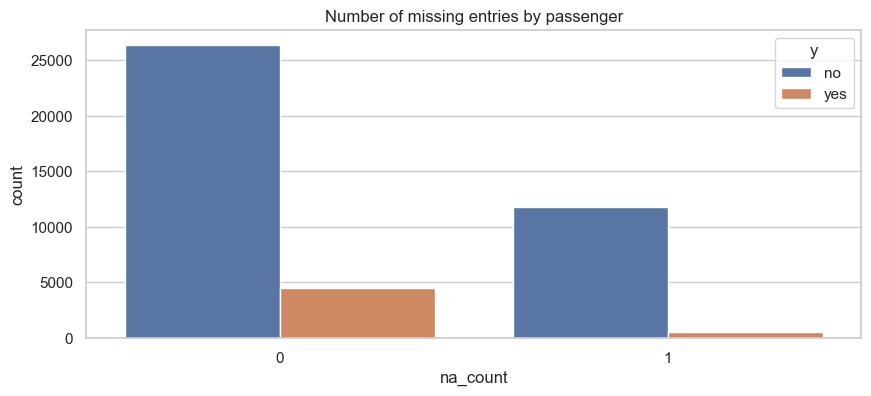

In [19]:
# Countplot of number of missing values by passenger

df['na_count']=df.isna().sum(axis=1)
plt.figure(figsize=(10,4))
sns.countplot(data=df, x='na_count', hue='y')
plt.title('Number of missing entries by passenger')

but you can see in categorical features there are some unknown coloumns that have to drop

### Outlier Detection

Box Plot
     

In [20]:
def outliers_indices(feature):#We will consider as outliers all points that go beyond three sigma.
    mid = df[feature].mean()
    sigma = df[feature].std()
    return df[(df[feature] < mid - 3*sigma) | (df[feature] > mid + 3*sigma)].index

In [21]:
wrong_age = outliers_indices('duration')#170 outlier features will be removed from the dataset, which is not significant in this case.
out = set(wrong_age)
print(len(out))

920


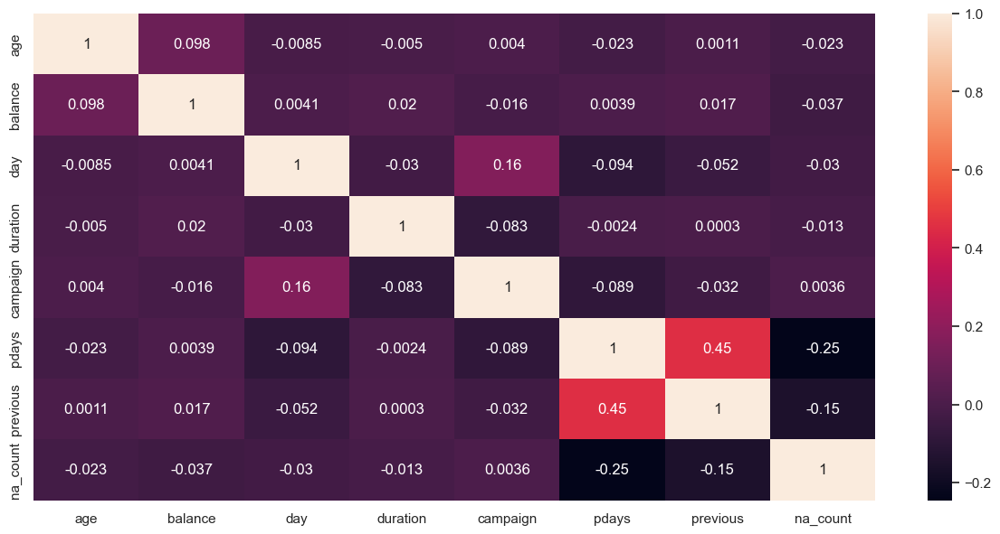

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'df' is your DataFrame

# Select only numeric columns or encode categorical columns
numeric_df = df.select_dtypes(include=['number'])

# Calculate the correlation matrix
cor_mat = numeric_df.corr()

# Plot the heatmap
fig = plt.figure(figsize=(15, 7))
sns.heatmap(cor_mat, annot=True)

plt.show()


NO one has matual relations

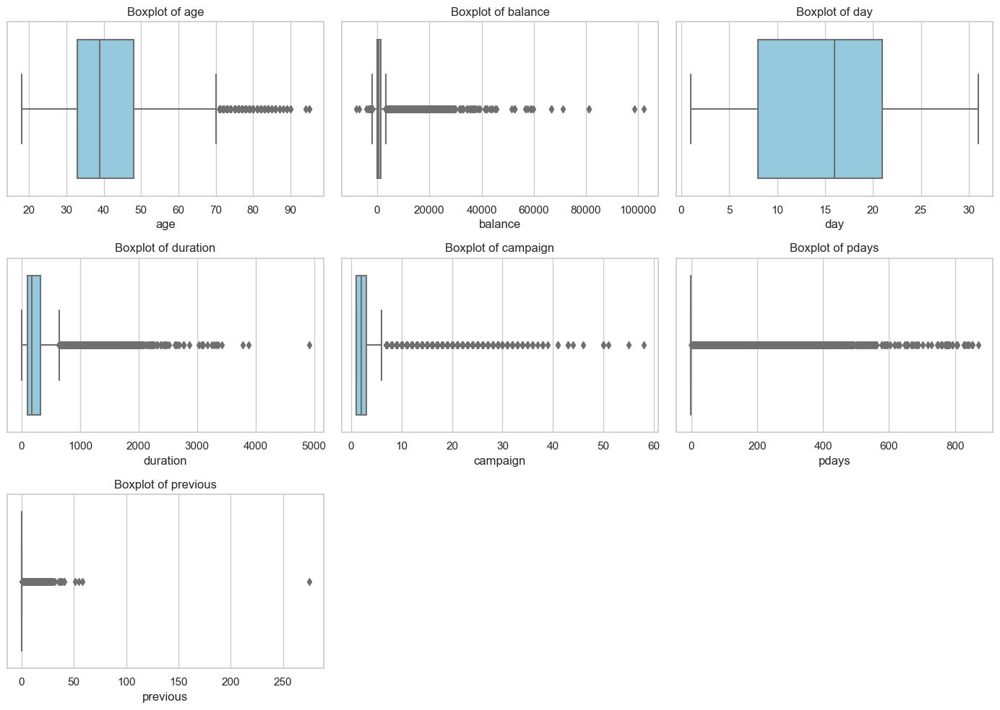

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of numerical features
numerical_features = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

# Set up the matplotlib figure
plt.figure(figsize=(14, 10))

# Create box plots for each numerical feature
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df[feature], color='skyblue')
    plt.title(f'Boxplot of {feature}')

# Adjust layout
plt.tight_layout()
plt.show()

detectioning outliers

In [24]:
import pandas as pd

# Define your numerical features
numerical_features = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

# Define a threshold for identifying outliers
outlier_threshold = 1.5

# Assess outliers and decide on action
for feature in numerical_features:
    # Convert feature to numeric type
    df[feature] = pd.to_numeric(df[feature], errors='coerce')
    
    # Drop missing values
    df.dropna(subset=[feature], inplace=True)
    
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - outlier_threshold * IQR
    upper_bound = Q3 + outlier_threshold * IQR
    
    # Identify outliers
    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]
    
    # Print information about outliers
    if not outliers.empty:
        print(f'Outliers in {feature}: {outliers}')
import pandas as pd

# Define your numerical features
numerical_features = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

# Define a threshold for identifying outliers
outlier_threshold = 1.5

# Assess outliers and decide on action
for feature in numerical_features:
    # Convert feature to numeric type
    df[feature] = pd.to_numeric(df[feature], errors='coerce')
    
    # Drop missing values
    df.dropna(subset=[feature], inplace=True)
    
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - outlier_threshold * IQR
    upper_bound = Q3 + outlier_threshold * IQR
    
    # Identify outliers
    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)][feature]
    
    # Print information about outliers
    if not outliers.empty:
        print(f'Outliers in {feature}: {outliers}')


Outliers in age: 29158    83
29261    75
29263    75
29322    83
29865    75
         ..
45163    71
45191    75
45204    73
45207    71
45208    72
Name: age, Length: 434, dtype: int64
Outliers in balance: 34       10635
65        6530
69       12223
70        5935
187       4080
         ...  
45164     4655
45181     6879
45185     4256
45191     3810
45208     5715
Name: balance, Length: 4545, dtype: int64
Outliers in duration: 37       1666
43       1492
53        787
59       1778
61        812
         ... 
45124     701
45199    1166
45200    1556
45206     977
45208    1127
Name: duration, Length: 3124, dtype: int64
Outliers in campaign: 758       7
780       8
906       7
1105      7
1386      8
         ..
44666     7
44680     9
44770     9
44886    12
45056     7
Name: campaign, Length: 2900, dtype: int64
Outliers in pdays: 24060    151
24062    166
24064     91
24072     86
24077    143
        ... 
45199    530
45201    184
45204     40
45208    184
45210    188
Name: pd

Use Logarithmic , Min-Max and Z-score

In [25]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Logarithmic scaling
df_log = df.copy()
for feature in numerical_features:
    df_log[feature] = np.log1p(df_log[feature])

# Min-Max scaling
scaler_minmax = MinMaxScaler()
df_minmax = df.copy()
df_minmax[numerical_features] = scaler_minmax.fit_transform(df_minmax[numerical_features])

# Z-score normalization
scaler_zscore = StandardScaler()
df_zscore = df.copy()
df_zscore[numerical_features] = scaler_zscore.fit_transform(df_zscore[numerical_features])




c:\Users\ASUS\anaconda3\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ASUS\anaconda3\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


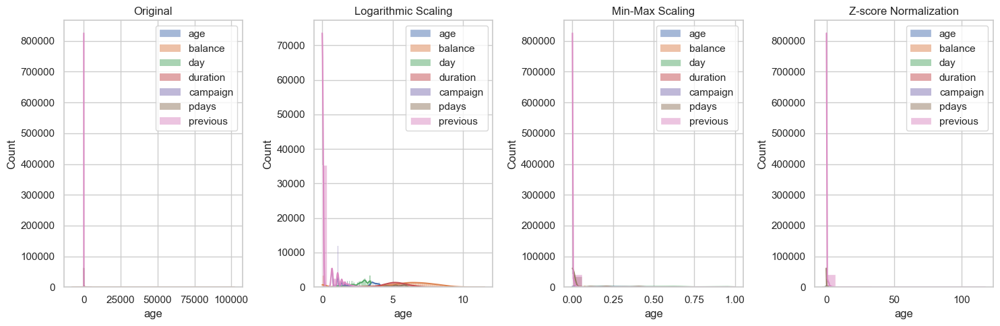

In [26]:
# Plot the distributions before and after scaling
plt.figure(figsize=(15, 5))

for i, (method_df, method_name) in enumerate(zip([df, df_log, df_minmax, df_zscore],
                                                ['Original', 'Logarithmic Scaling', 'Min-Max Scaling', 'Z-score Normalization'])):
    plt.subplot(1, 4, i + 1)
    for feature in numerical_features:
        sns.histplot(method_df[feature], kde=True, label=feature, alpha=0.5)
    plt.title(method_name)
    plt.legend()

plt.tight_layout()
plt.show()

This will show you how each scaling method affects the spread of the data (variance) for each feature. Lower variance generally indicates that the data points are more tightly packed, which can be desirable in certain scenarios.

In [27]:
# Calculate variance for each feature before and after scaling
original_variances = df[numerical_features].var()
log_variances = df_log[numerical_features].var()
minmax_variances = df_minmax[numerical_features].var()
zscore_variances = df_zscore[numerical_features].var()

# Display the variances
variance_df = pd.DataFrame({
    'Original Variance': original_variances,
    'Logarithmic Scaling Variance': log_variances,
    'Min-Max Scaling Variance': minmax_variances,
    'Z-score Normalization Variance': zscore_variances
})

print(variance_df)

          Original Variance  Logarithmic Scaling Variance  \
age            1.105156e+02                      0.060586   
balance        9.254394e+06                           NaN   
day            6.898914e+01                      0.394239   
duration       6.664762e+04                      0.846767   
campaign       9.388016e+00                      0.260495   
pdays          1.008430e+04                           NaN   
previous       5.441359e+00                      0.286058   

          Min-Max Scaling Variance  Z-score Normalization Variance  
age                       0.018640                        1.000023  
balance                   0.000763                        1.000023  
day                       0.076655                        1.000023  
duration                  0.002756                        1.000023  
campaign                  0.002890                        1.000023  
pdays                     0.013262                        1.000023  
previous                  0.

so we choose Min-Max

In [28]:
# Min-Max scaling
scaler_minmax = MinMaxScaler()
df[numerical_features] = scaler_minmax.fit_transform(df[numerical_features])

# Categorical Features
      Relation between categorical features and our goal

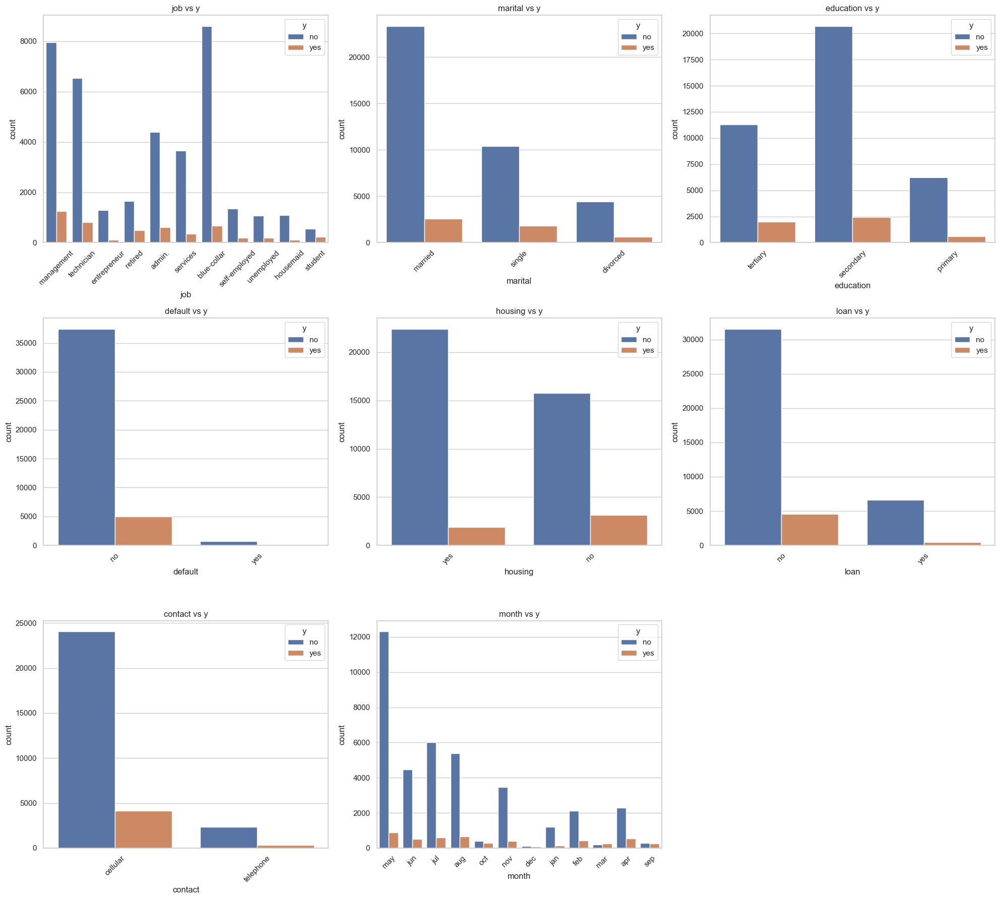

In [29]:
# List of categorical features
categorical_features = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month']

# Set the size for the plots
plt.figure(figsize=(20, 18))

# Plot the distribution of categorical features in relation to the target variable 'y'
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 3, i)
    sns.countplot(data=df, x=feature, hue='y')
    plt.title(f'{feature} vs y')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()



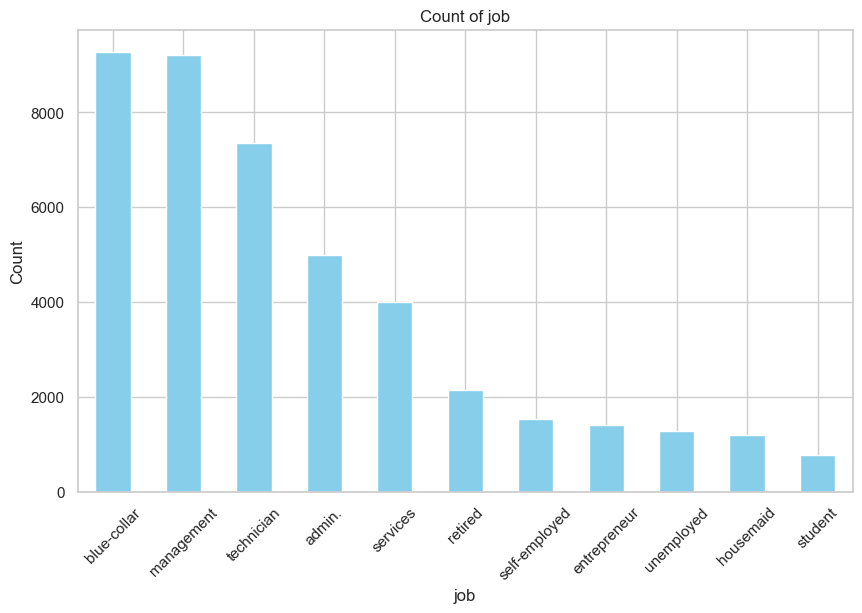

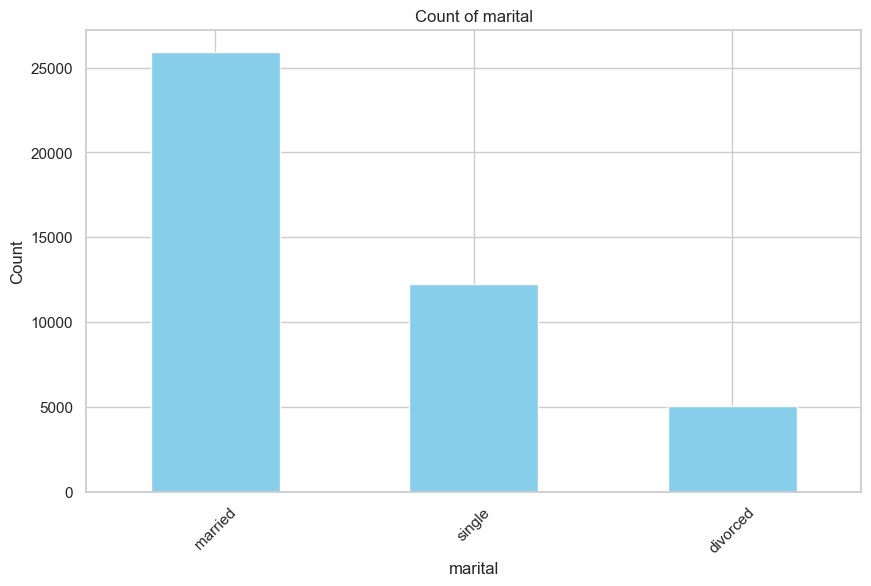

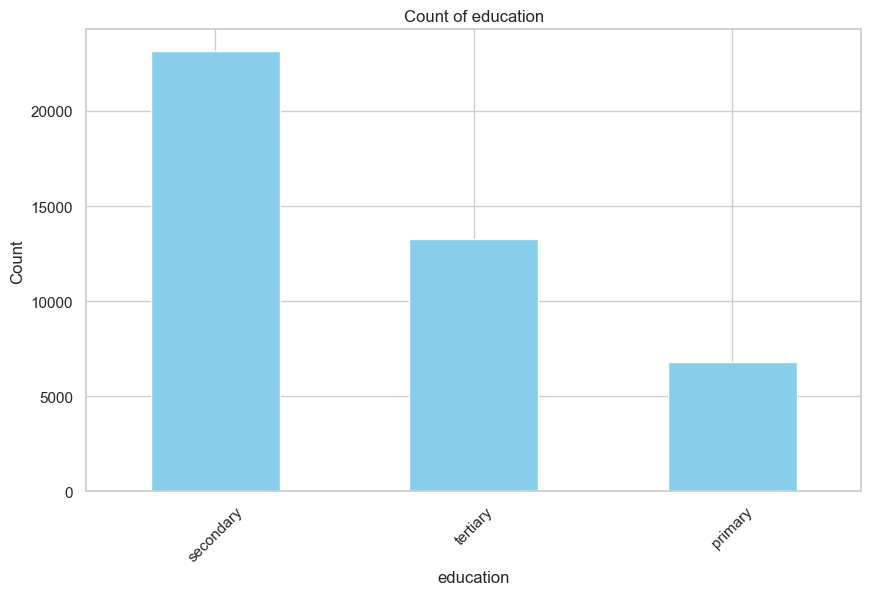

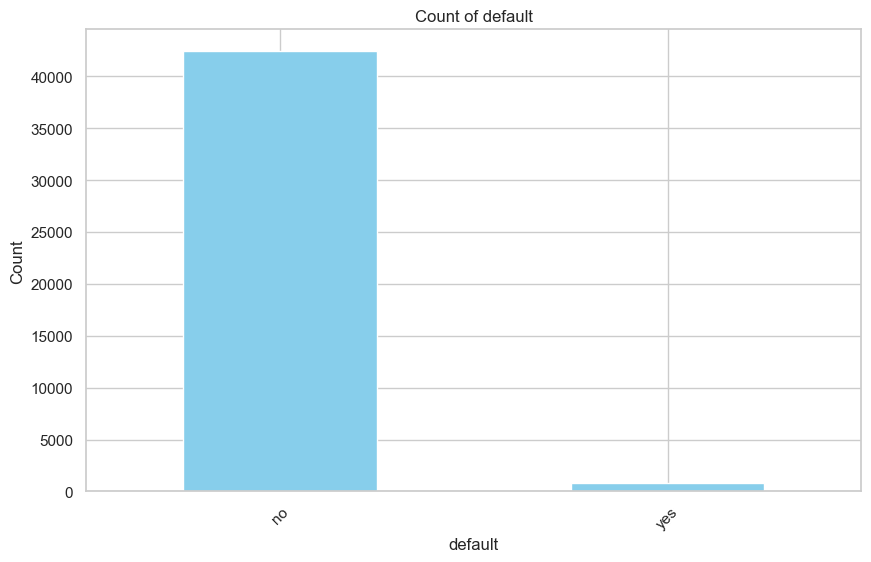

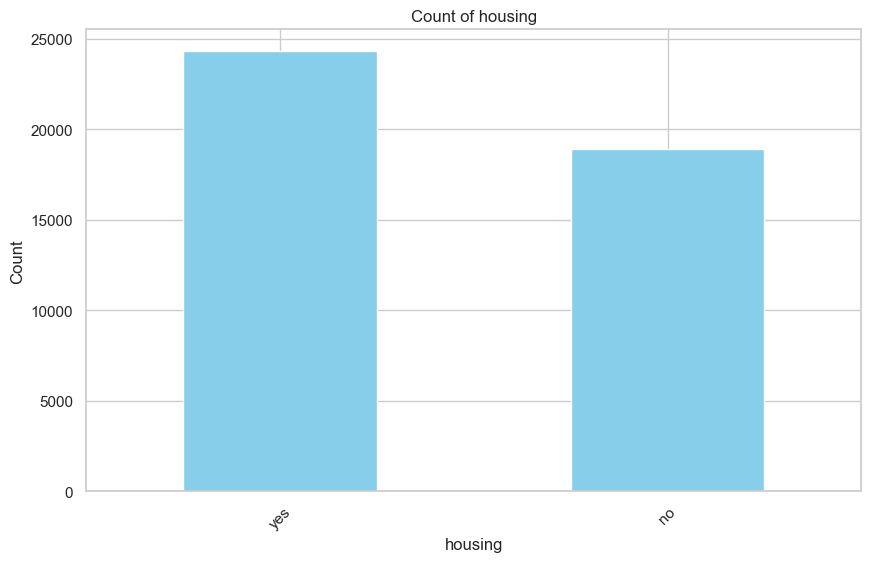

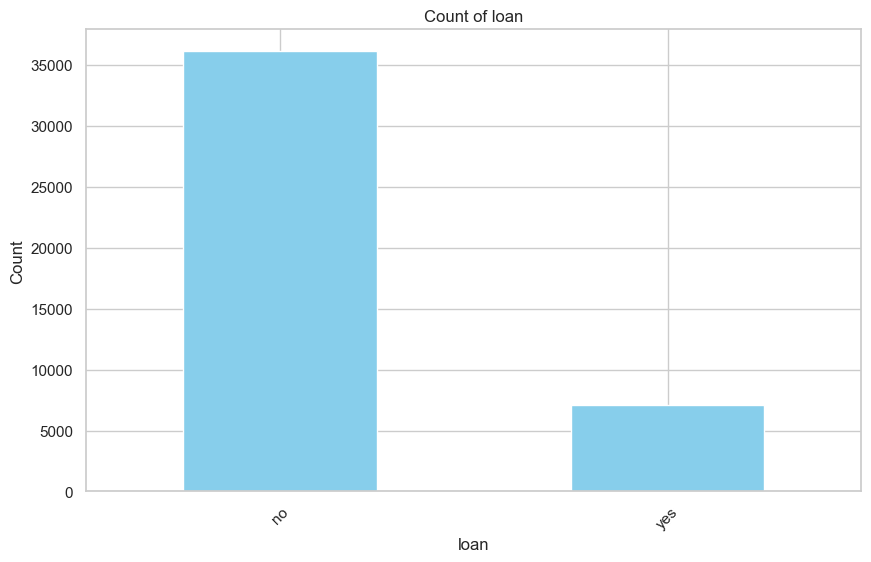

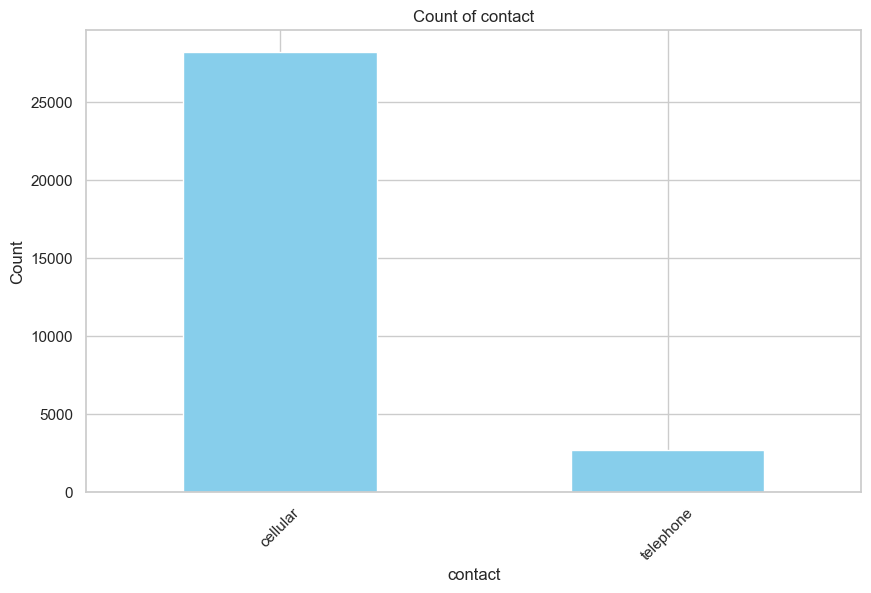

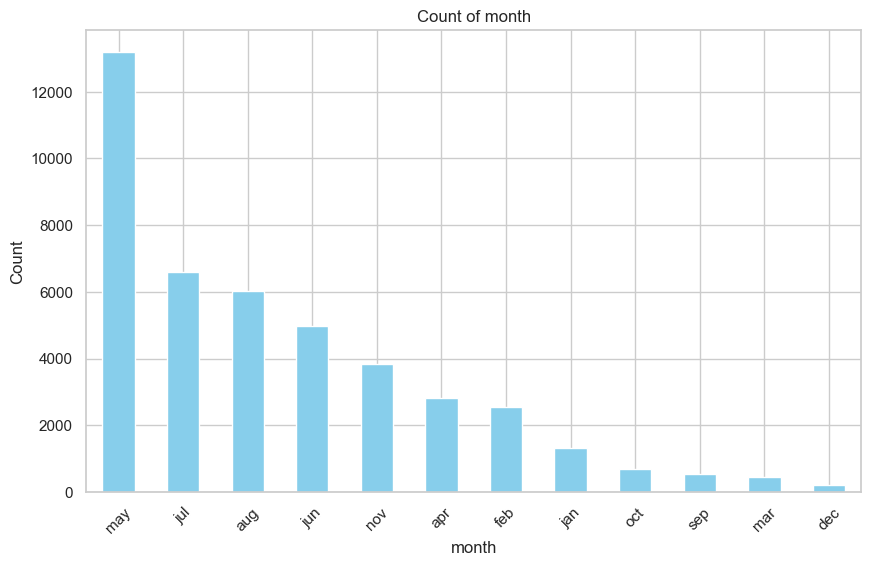

In [30]:
import matplotlib.pyplot as plt

# Define categorical features
categorical_features = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month']

# Plot bar charts for categorical features
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    df[feature].value_counts().plot(kind='bar', color='skyblue')
    plt.title(f'Count of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()


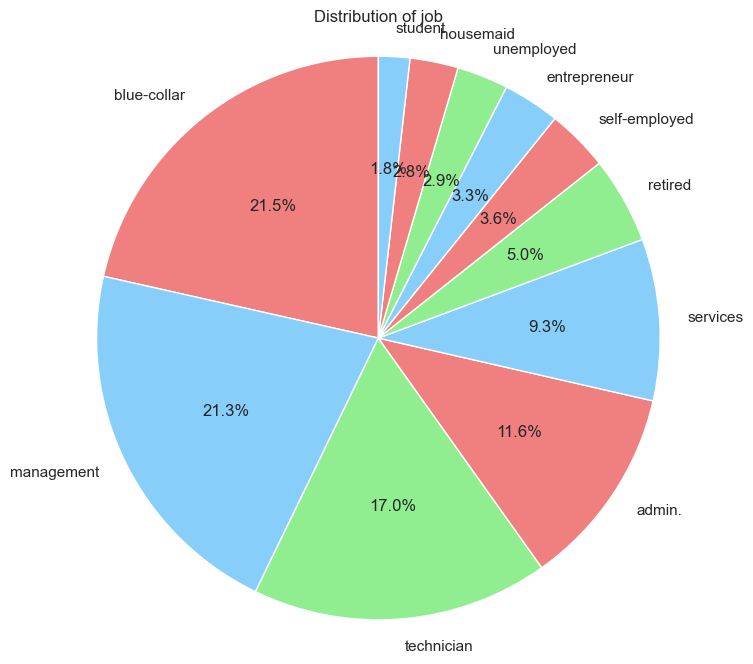

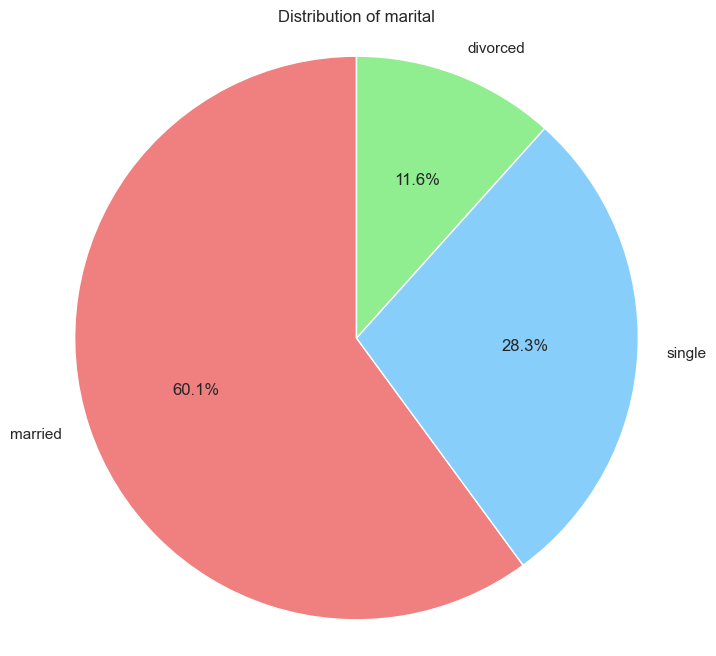

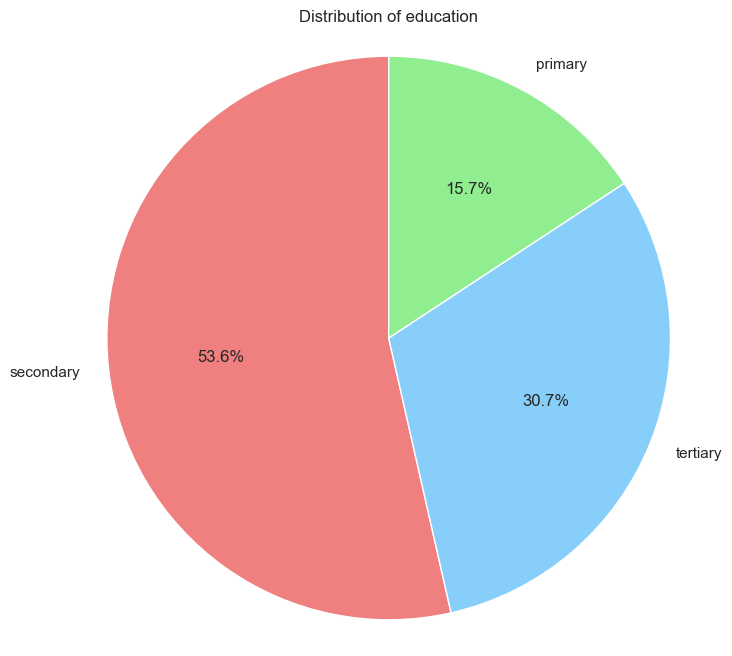

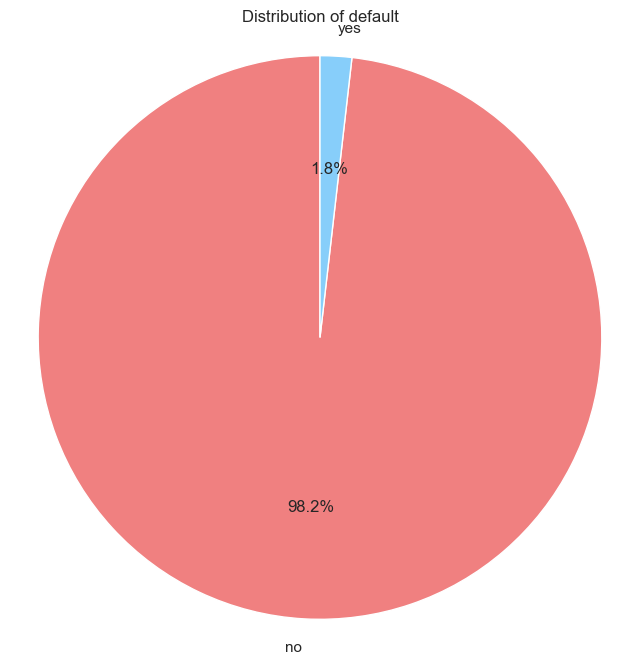

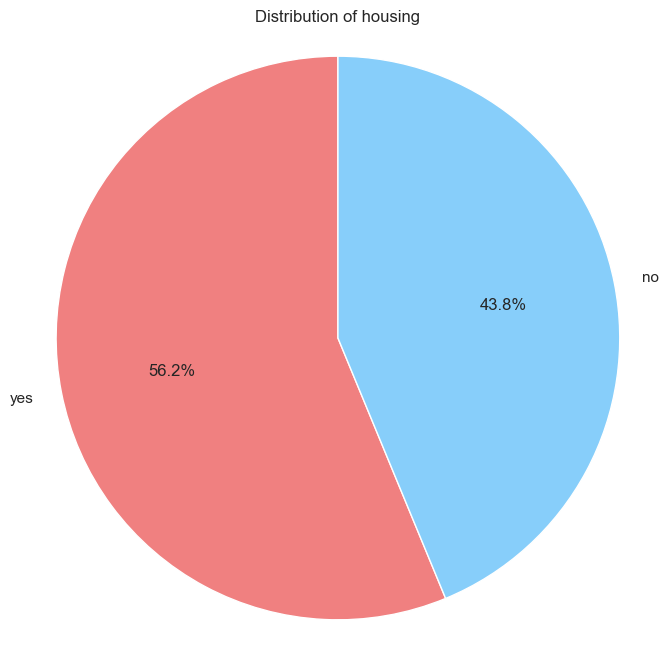

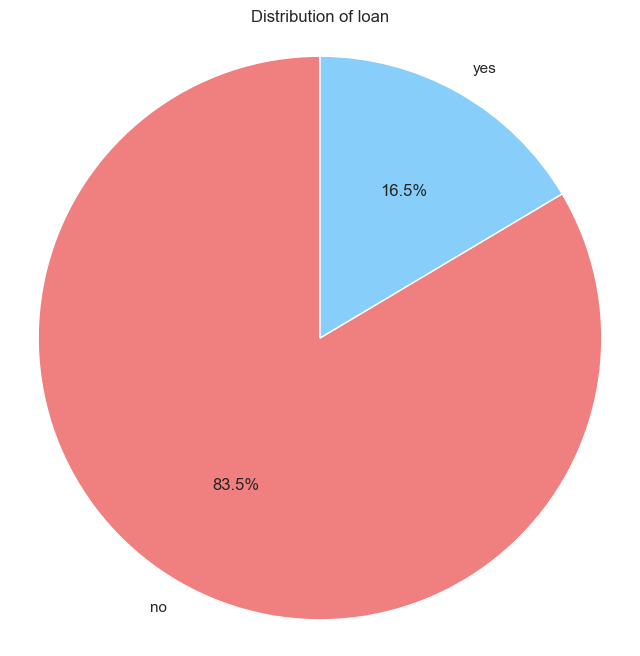

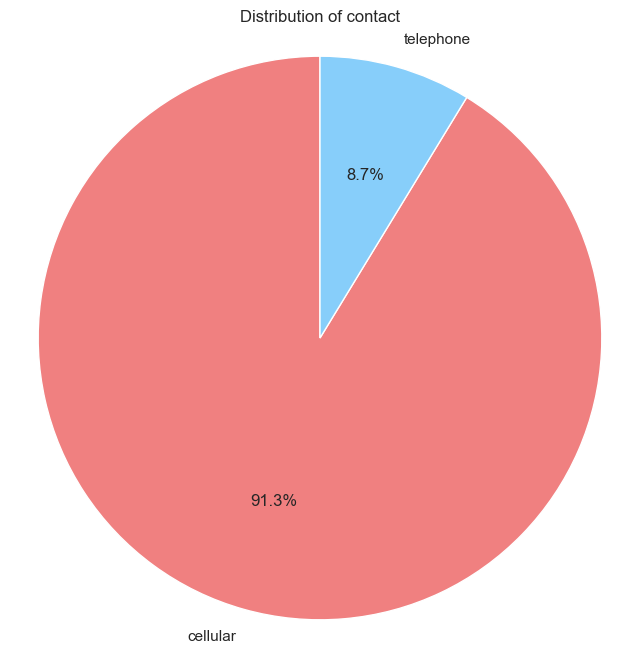

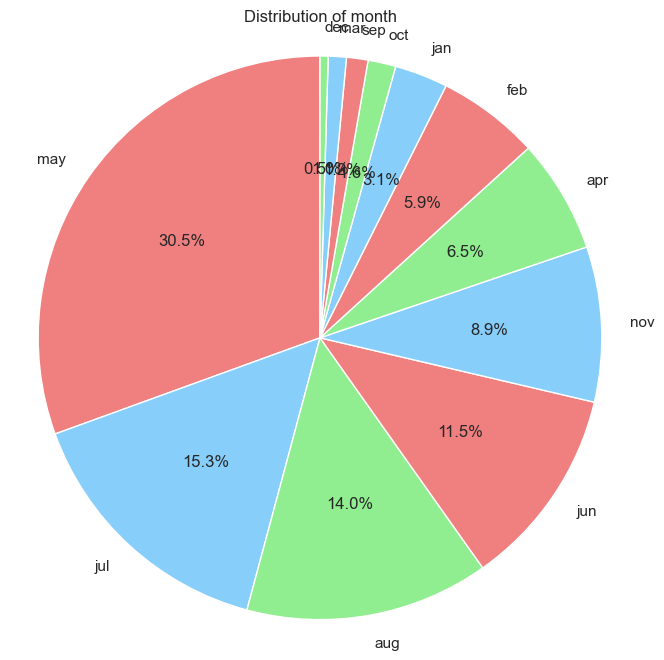

In [31]:
import matplotlib.pyplot as plt

# Define categorical features
categorical_features = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month']

# Plot pie charts for categorical features
for feature in categorical_features:
    plt.figure(figsize=(8, 8))
    df[feature].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightcoral', 'lightskyblue', 'lightgreen'])
    plt.title(f'Distribution of {feature}')
    plt.ylabel('')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()


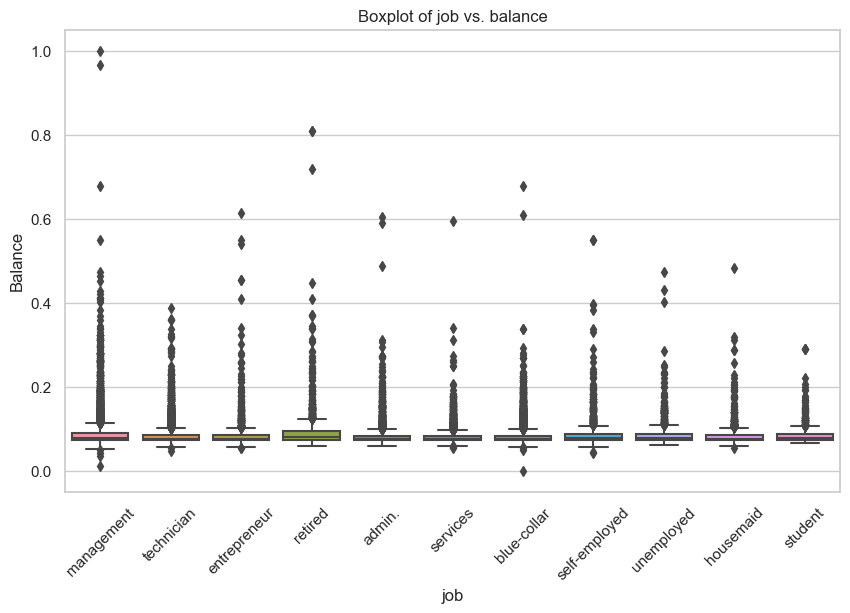

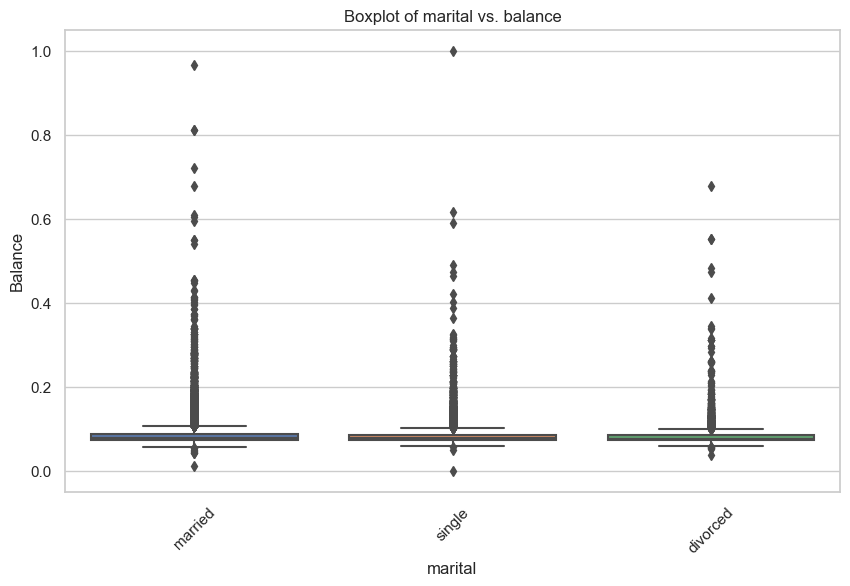

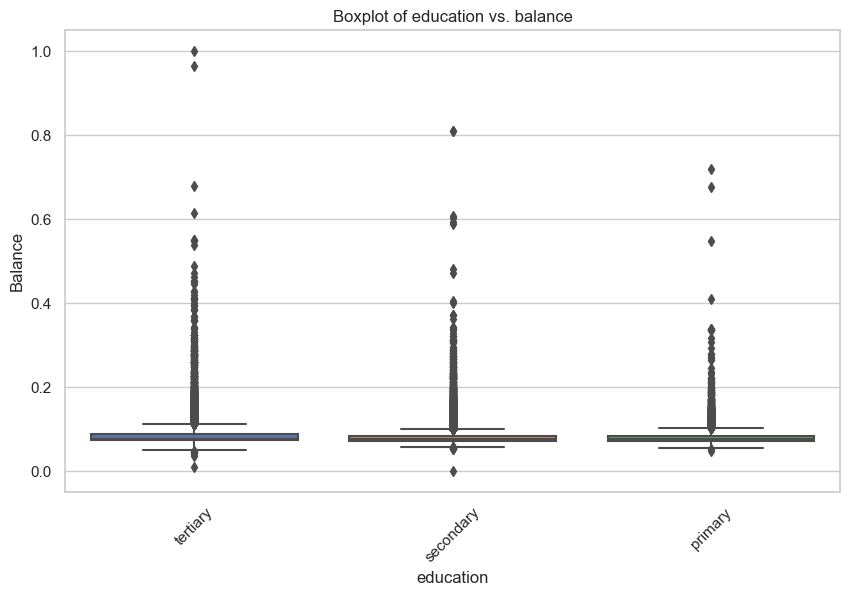

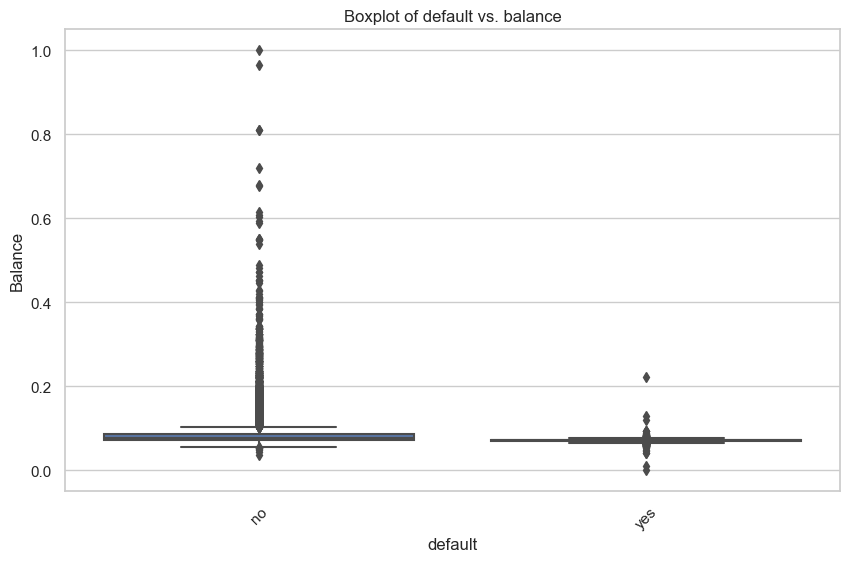

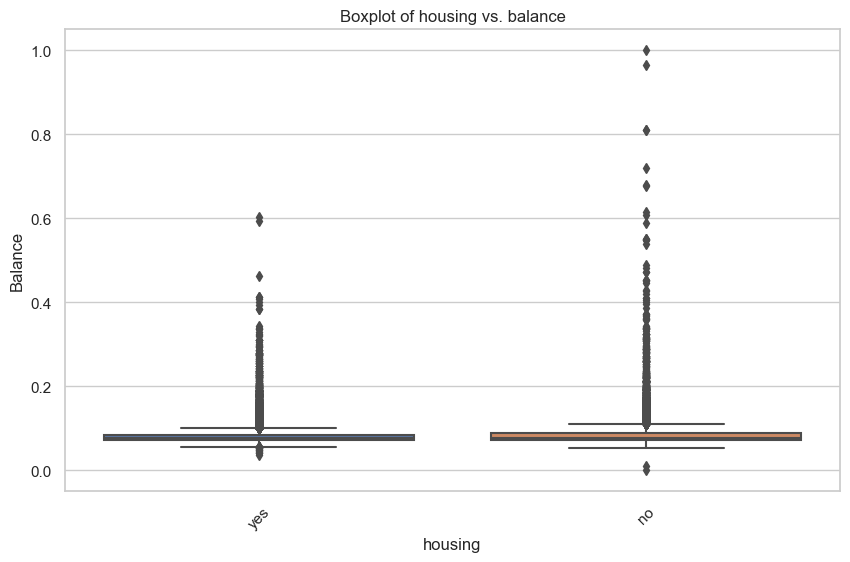

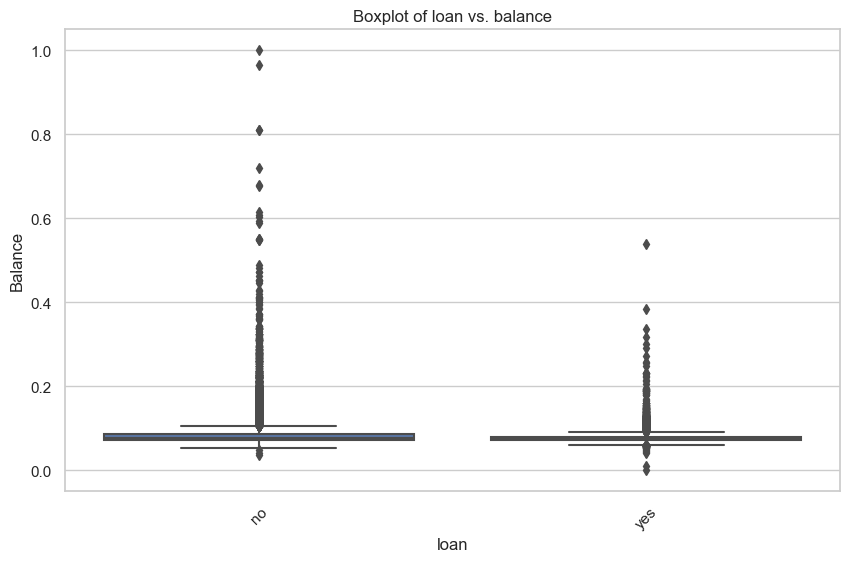

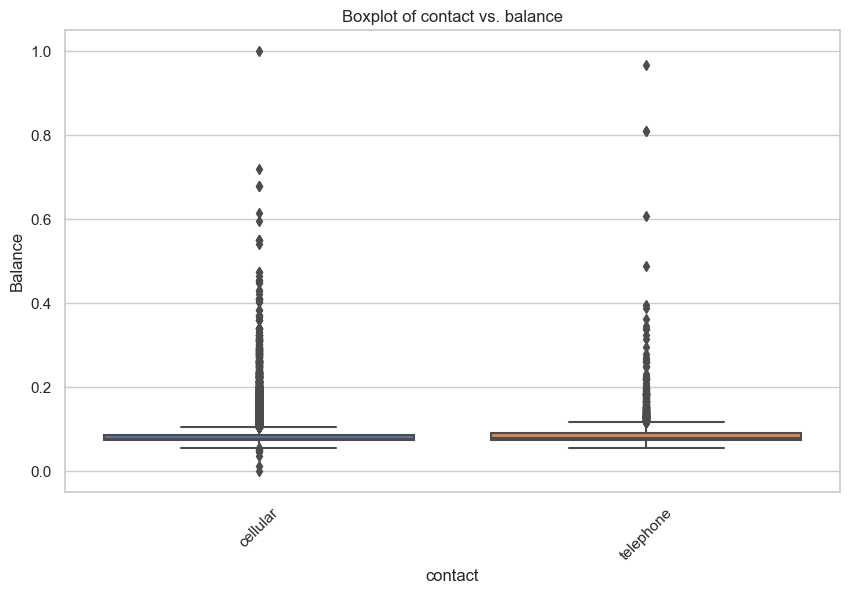

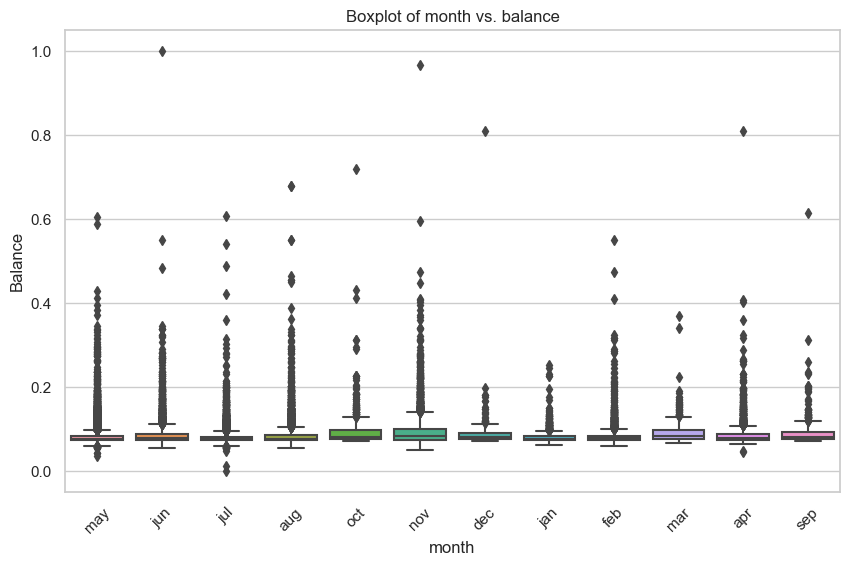

In [32]:
import seaborn as sns

# Define categorical features
categorical_features = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month']

# Plot box plots for categorical features
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=feature, y='balance', data=df)
    plt.title(f'Boxplot of {feature} vs. balance')
    plt.xlabel(feature)
    plt.ylabel('Balance')
    plt.xticks(rotation=45)
    plt.show()


In [33]:

# Function for building a machine learning model

from sklearn.neighbors import KNeighborsClassifier    
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

def build_model(X, y):
    train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.1, random_state=7)
    
    model = KNeighborsClassifier()
    model.fit(train_X, train_y)

    preds = model.predict(test_X)
    return accuracy_score(test_y, preds)

In [34]:
df.describe(include = ["object"])

,job,marital,education,default,housing,loan,contact,month,y
count,43193,43193,43193,43193,43193,43193,30907,43193,43193
unique,11,3,3,2,2,2,2,12,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,no
freq,9278,25946,23131,42411,24292,36086,28213,13192,38172


#
  no feature is heavily correlated with other features

## One-Hot Encoding



In [35]:
#def one_hot_encode(data, columns):
    #for column in columns:
       # oh_col = pd.get_dummies(data[column], dtype=int)
       # data = pd.concat([data, oh_col], axis=1)     # Adding new columns 

    #data.drop(columns, axis=1, inplace=True)    # Drop the columns we no longer need
    #return data

#df = one_hot_encode(df, categorical_features)

In [36]:
#from sklearn.impute import SimpleImputer

#imputer = SimpleImputer(strategy='most_frequent')

# Assume your DataFrame is called df
#df['contact'] = imputer.fit_transform(df['contact'].values.reshape(-1, 1)).ravel()

# Save the transformed data
#df.to_csv('filled_data.csv', index=False)

In [37]:
#df.isna().sum()

Because one hot encoding makes lots of features we use frequent encoding

In [38]:
def frequent_encoding(data, columns):
    for column in columns:
        freq = data[column].value_counts().to_dict()    # Calculating frequency
        data[column] = data[column].map(freq)           # Mapping frequency to the data

    return data

df = frequent_encoding(df, categorical_features)

In [39]:
# Calculate most frequent value in the 'contact' column
most_frequent_value = df['contact'].value_counts().idxmax()

# Fill the missing values with the most frequent value
df['contact'].fillna(most_frequent_value, inplace=True)

# Save the transformed data
df.to_csv('filled_data.csv', index=False)

In [40]:
df.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
y            0
na_count     0
dtype: int64

## time-related Coloumns

this coloumns are AGE , DAY , PDAY , MOUNTH and DURATION

In [41]:
print(df['y'].unique())

['no' 'yes']


In [42]:
df['y'] = df['y'].map({'yes': 1, 'no': 0})

In [43]:
print(df['y'].unique())

[0 1]


                age           job       marital     education       default  \
count  43193.000000  43193.000000  43193.000000  43193.000000  43193.000000   
mean       0.295637   6453.806242  19627.709606  17529.780404  41657.315885   
std        0.136528   3004.906684   8020.104589   6365.512883   5550.476516   
min        0.000000    775.000000   5028.000000   6800.000000    782.000000   
25%        0.194805   4004.000000  12219.000000  13262.000000  42411.000000   
50%        0.272727   7355.000000  25946.000000  23131.000000  42411.000000   
75%        0.389610   9216.000000  25946.000000  23131.000000  42411.000000   
max        1.000000   9278.000000  25946.000000  23131.000000  42411.000000   

            balance       housing          loan       contact           day  \
count  43193.000000  43193.000000  43193.000000  43193.000000  43193.000000   
mean       0.085096  21932.930452  31317.779386  26621.348899      0.493647   
std        0.027619   2674.453290  10744.533965   6

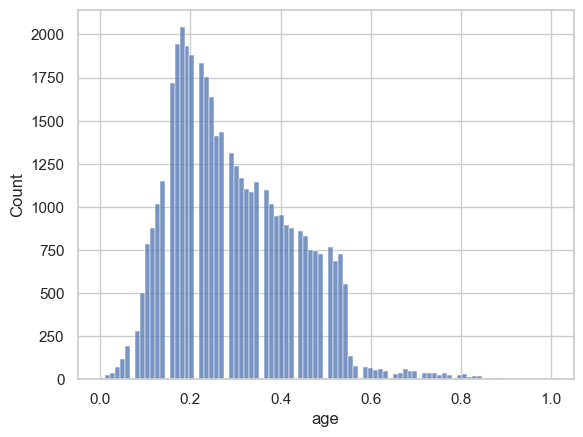

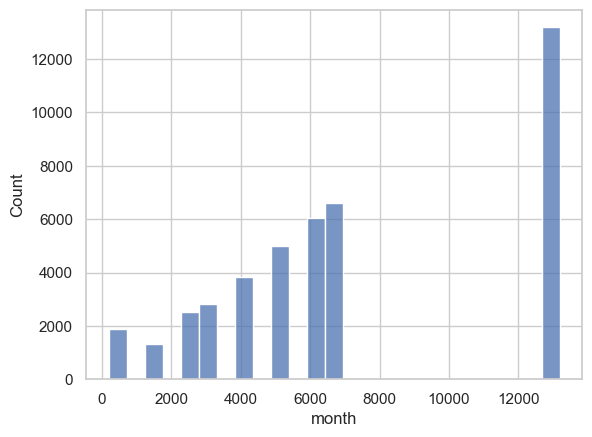

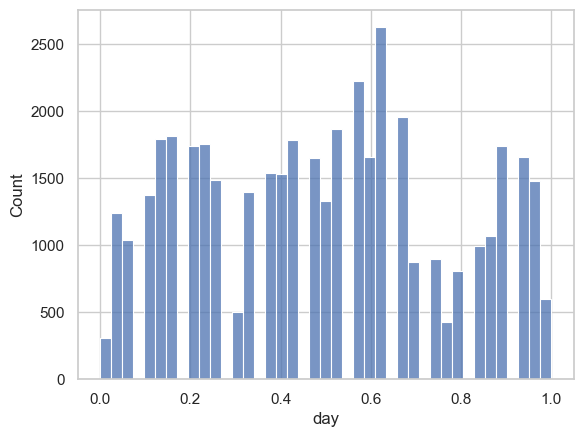

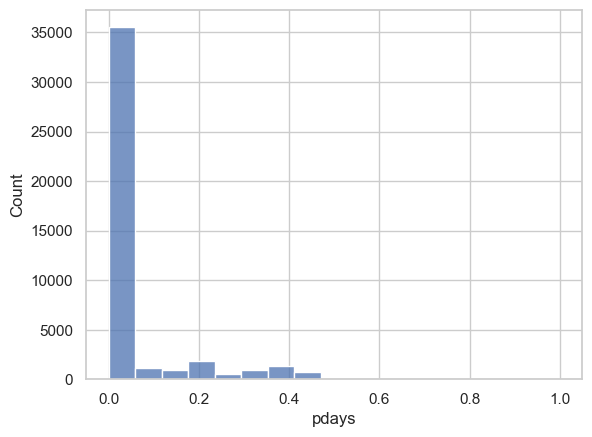

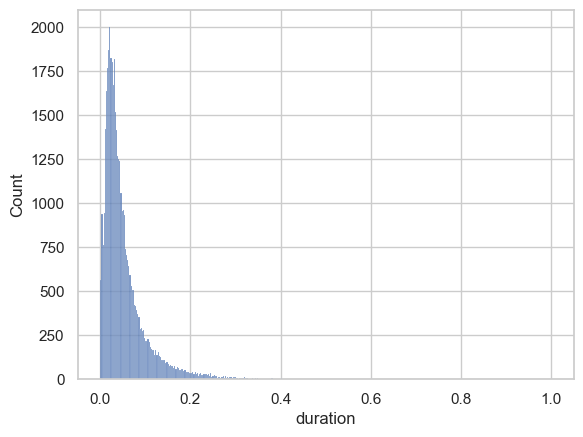

               age     month       day     pdays  duration         y
age       1.000000 -0.118609 -0.008451 -0.023248 -0.004953  0.024760
month    -0.118609  1.000000 -0.004760 -0.014963 -0.004343 -0.155825
day      -0.008451 -0.004760  1.000000 -0.094343 -0.030074 -0.030247
pdays    -0.023248 -0.014963 -0.094343  1.000000 -0.002403  0.101446
duration -0.004953 -0.004343 -0.030074 -0.002403  1.000000  0.397393
y         0.024760 -0.155825 -0.030247  0.101446  0.397393  1.000000


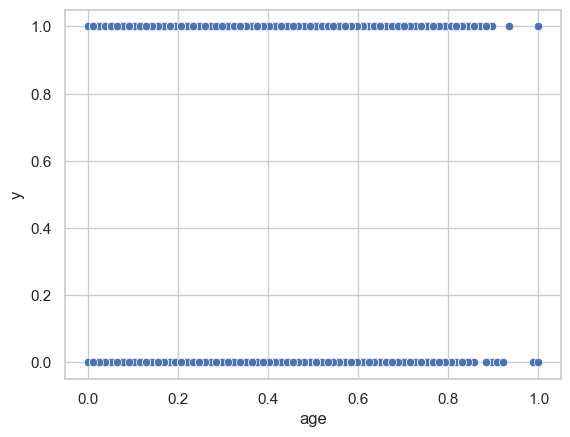

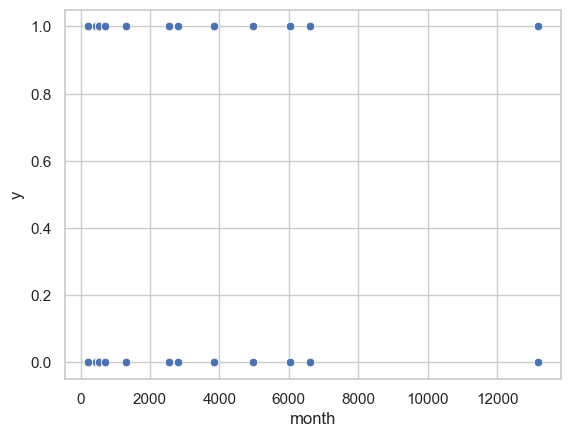

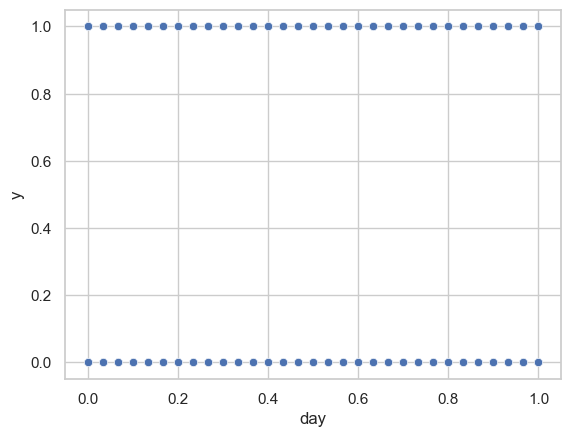

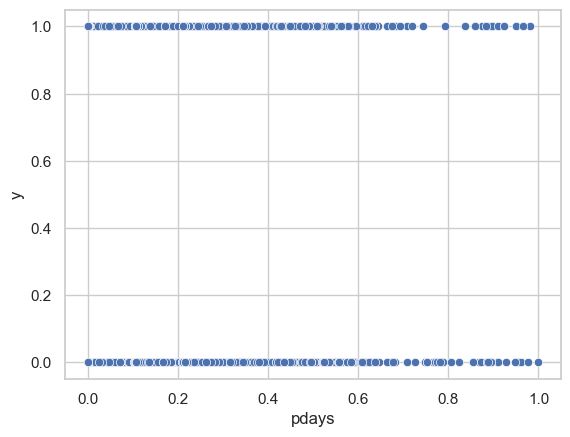

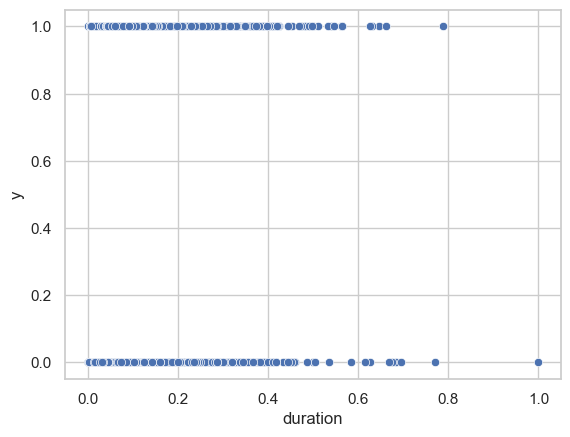

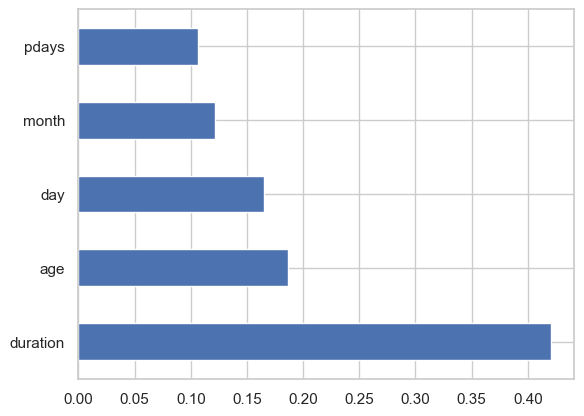

In [44]:
# Required Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesClassifier

# 1. Check Descriptive Statistics
print(df.describe(include='all'))

# 2. Visualize Data
time_related_columns = ['age', 'month', 'day', 'pdays', 'duration']

for column in time_related_columns:
  sns.histplot(df[column])
  plt.show()

# 3. Correlation Analysis
correlations = df[time_related_columns + ['y']].corr()
print(correlations)

# 4. Visualize the Relation
for column in time_related_columns:
  sns.scatterplot(data=df, x=column, y='y')
  plt.show()

# 5. Feature Importance
model = ExtraTreesClassifier()
model.fit(df[time_related_columns], df['y'])

feat_importances = pd.Series(model.feature_importances_, index=time_related_columns)
feat_importances.nlargest(len(time_related_columns)).plot(kind='barh')
plt.show()

In [45]:
import pandas as pd
from scipy.stats import chi2_contingency

# Creating a contingency table
contingency_table_marital_loan = pd.crosstab(df['marital'], df['loan'])

# Performing the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table_marital_loan)

# Displaying the p-value
print(f'Chi-Square test p-value for marital status and personal loan: {p}')

Chi-Square test p-value for marital status and personal loan: 1.1107981035383268e-26


P-value: 1.1107981035383268e-26

This is a very small p-value, significantly less than the common alpha level of 0.05. With such a low p-value, we can reject the null hypothesis. This suggests that there is indeed an association between marital status and having a personal loan. There seems to be a significant difference in the distribution of personal loans among different marital statuses.
________________________________________

####  Effect of Previous Marketing Campaign on the Client:
Here, we’ll use a Chi-Square Test for Independence to check if previous campaign outcomes relate to the success of the current campaign.

Null Hypothesis (H0):
The outcome of the previous marketing campaign has no effect on the success of the current campaign.

Alternative Hypothesis (H1):
The outcome of the previous marketing campaign affects the success of the current campaign.

In [46]:
# Create a contingency table
contingency_table = pd.crosstab(df['previous'], df['y'])

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

print('Chi-square statistic:', chi2)
print('p-value:', p)

# Interpret p-value
alpha = 0.05
if p < alpha:
    print("Reject the Null Hypothesis: There is a significant effect of the previous marketing campaign on the client.")
else:
    print("Fail to Reject the Null Hypothesis: There is no significant effect of the previous marketing campaign on the client.")

Chi-square statistic: 1285.585047098879
p-value: 1.3183005301217226e-243
Reject the Null Hypothesis: There is a significant effect of the previous marketing campaign on the client.


Chi-square statistic: 1285.585047098879
p-value: 1.3183005301217226e-243

Given that the p-value is significantly less than 0.05 (a common threshold for statistical significance), you would reject the null hypothesis. This means that the statistical test has found evidence to suggest there is a significant effect of the previous marketing campaign on the client’s current campaign outcome. In other words, the number of contacts from the previous campaign appears to be associated with whether the client subscribed or not in the current campaign.
____________________________________________

####  Job Type and Credit Default:
Again, a Chi-Square Test for Independence will be suitable for this relationship.

Null Hypothesis (H0):
There is no association between the type of job and credit default (they are independent).

Alternative Hypothesis (H1):
There is an association between the type of job and credit default (they are not independent).

In [47]:
# Creating a contingency table
contingency_table_job_default = pd.crosstab(df['job'], df['default'])

# Performing the Chi-Square test
chi2, p, dof, expected = chi2_contingency(contingency_table_job_default)

# Displaying the p-value
print(f'Chi-Square test p-value for job type and credit default: {p}')

Chi-Square test p-value for job type and credit default: 5.798049208900877e-08


P-value: 5.798049208900877e-08

Similar to 1.5.1, the p-value reported here is also much smaller than 0.05, leading us to reject the null hypothesis. This means there is a statistically significant association between the type of job and the likelihood of a credit default. Different jobs appear to have different rates of credit default.

In summary, the analysis indicates significant associations in 1.5.1 and 1.5.3, but for 1.5.2, you will need to address the data quality or methodological issue that led to a nan result before you can conclude.
________________________________

#####  Hypothesis Test for Education Level and Balances:

Null Hypothesis (H0):
The average bank balance does not differ based on the education level of the clients. This implies that education level has no effect on the average bank balance of the clients.

Alternative Hypothesis (H1):
The average bank balance differs based on the education level of the clients. This would suggest that education level does have an effect on the average bank balance of the clients.

For this hypothesis, you could use ANOVA (Analysis of Variance) if the data is normally distributed or the Kruskal-Wallis test if the data is not normally distributed, to compare the average balances across different education levels.

In [48]:
from scipy.stats import f_oneway, kruskal

# Group data by education levels
groups = df.groupby('education')['balance'].apply(list)

# Perform ANOVA or Kruskal-Wallis test depending on the distribution
# Using ANOVA
anova_stat, anova_pvalue = f_oneway(*groups)

# Using Kruskal-Wallis
kruskal_stat, kruskal_pvalue = kruskal(*groups)

print(f'ANOVA p-value for education level and balance: {anova_pvalue}')
print(f'Kruskal-Wallis p-value for education level and balance: {kruskal_pvalue}')

ANOVA p-value for education level and balance: 7.217782995033163e-75
Kruskal-Wallis p-value for education level and balance: 4.172247430472939e-78


#####  Hypothesis Test for Age and Subscription to a Term Deposit:

Null Hypothesis (H0):
The average age of clients who subscribed to a term deposit is equal to that of the clients who did not subscribe. This would suggest age does not influence the likelihood of subscribing to a term deposit.

Alternative Hypothesis (H1):
The average age of clients who subscribed to a term deposit is different from that of the clients who did not subscribe. This would suggest that age might influence the likelihood of subscribing to a term deposit.

For this hypothesis, you can again use an independent t-test if the age data is normally distributed or a non-parametric test like the Mann-Whitney U test if it is not normally distributed.

In [49]:
from scipy.stats import ttest_ind, mannwhitneyu


age_subscribed = df[df['y'] == 1]['age'].dropna()
age_not_subscribed = df[df['y'] == 0]['age'].dropna()


if len(age_subscribed) > 0 and len(age_not_subscribed) > 0:
    # If the lengths are non-zero, you can run the statistical tests

    # Using Independent Samples t-test
    t_stat_age, p_value_age = ttest_ind(age_subscribed, age_not_subscribed, equal_var=False)

    # Using Mann-Whitney U test
    u_stat_age, p_value_age_mw = mannwhitneyu(age_subscribed, age_not_subscribed, alternative='two-sided')

    print(f't-test p-value for age and term deposit subscription: {p_value_age}')
    print(f'Mann-Whitney U test p-value for age and term deposit subscription: {p_value_age_mw}')
else:
    # If either group has zero length, you cannot run the test
    print("Cannot run t-test or Mann-Whitney U test due to insufficient data in one or both groups.")

t-test p-value for age and term deposit subscription: 3.1121743429789344e-05
Mann-Whitney U test p-value for age and term deposit subscription: 0.050826606562409775


#### Implications of test results:
The results of a t-test determine whether the difference between groups or a group and a known value is statistically significant—that is, unlikely to be due to chance alone.

If you conduct a t-test and receive a p-value lower than your predetermined significance level (commonly 0.05), you would reject the null hypothesis in favor of the alternative hypothesis, which suggests there is a significant difference between your groups or between the group mean and known value.

#### One-sample t-test:
The one-sample t-test assesses whether the mean of a single group differs significantly from a known or hypothesized mean (test value).

Here’s an example of how to perform a one-sample t-test with Python using the scipy.stats package. Let’s say we want to know if the average balance (‘balance’ column) is significantly different from a hypothesized value:

In [50]:
import pandas as pd
from scipy import stats

# Let's say that the hypothesized average balance value is $1500
hypothesized_mean_value = 1500

# Perform the one-sample t-test between the balance column and the hypothesized average value
t_statistic, p_value = stats.ttest_1samp(df['balance'], hypothesized_mean_value)

print(f"T-statistic: {t_statistic}, P-value: {p_value}")

# Interpret the p-value
alpha = 0.05
if p_value < alpha:
    print("Reject the Null Hypothesis: The average balance is significantly different from the hypothesized value.")
else:
    print("Fail to Reject the Null Hypothesis: The average balance is not significantly different from the hypothesized value.")

T-statistic: -11286727.287245963, P-value: 0.0
Reject the Null Hypothesis: The average balance is significantly different from the hypothesized value.


We tested if there’s a significant difference between the mean balance of a dataset and a hypothesized mean balance of $1500. The result was a t-statistic of -11286727.287245963 and a p-value of 0.0.

A t-statistic is the calculated difference represented in terms of standard error. The magnitude of the t-statistic here is quite large, and the associated p-value is 0.0, which is practically zero. Given a threshold alpha of 0.05, you have enough evidence to reject the null hypothesis which means the average balance in the dataset is significantly different than the hypothesized value of $1500. However, the extremely large t-statistic suggests there might have been some errors in the data, the calculations, or an extremely large sample size.
__________________________________________

#### Paired t-test:
A paired t-test is used when you want to compare two related samples, matched samples, or repeated measurements on the same subject. This is appropriate when the same subjects are involved in both groups being compared, for instance before and after a certain treatment or intervention.

#### Conducting a paired t-test:
Let’s use ‘duration’ (perhaps the duration of the last contact in seconds) and ‘campaign’ (number of contacts performed during this campaign), assuming that you have before-treatment and after-treatment like data for these columns. Here is how you might perform a paired t-test:

In [51]:
t_statistic, p_value = stats.ttest_rel(df['duration'], df['campaign'])

print(f"Paired T-test T-statistic: {t_statistic}, P-value: {p_value}")

# Interpret the p-value
alpha = 0.05
if p_value < alpha:
    print("Reject the Null Hypothesis: There is a significant difference between the two related numerical columns.")
else:
    print("Fail to Reject the Null Hypothesis: There is no significant difference between the two related numerical columns.")

Paired T-test T-statistic: 57.62569256500134, P-value: 0.0
Reject the Null Hypothesis: There is a significant difference between the two related numerical columns.


# K_Means Plots

c:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


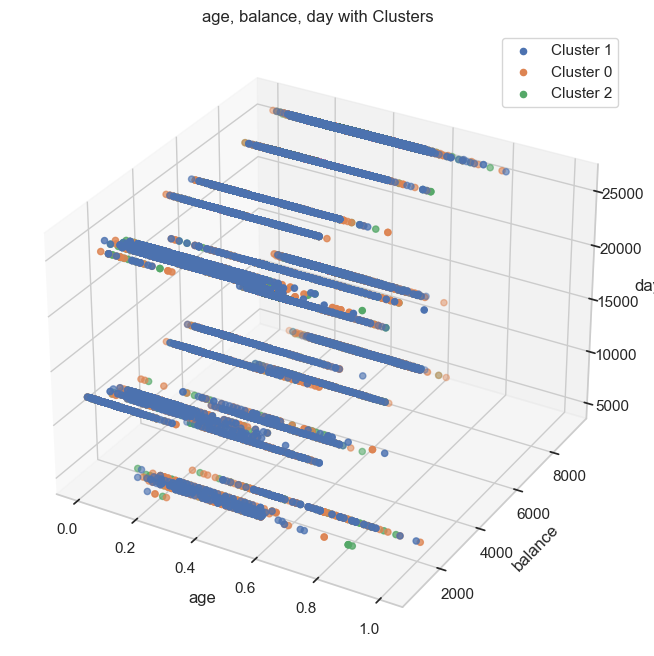

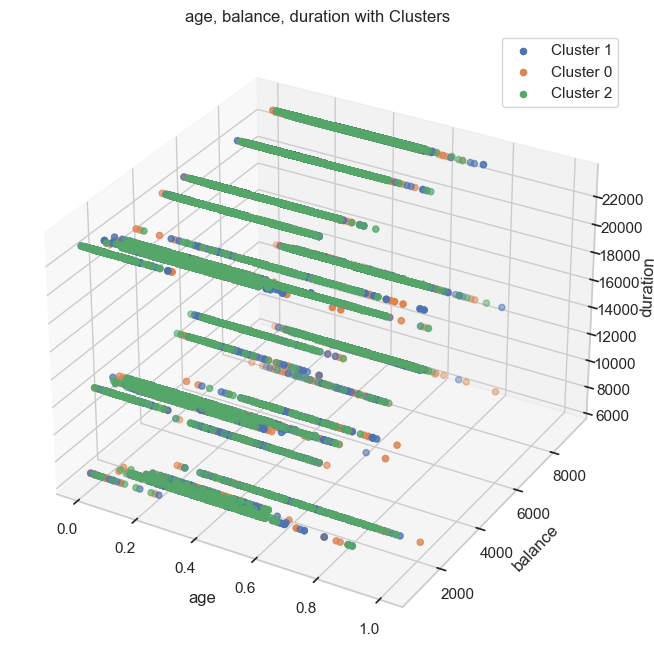

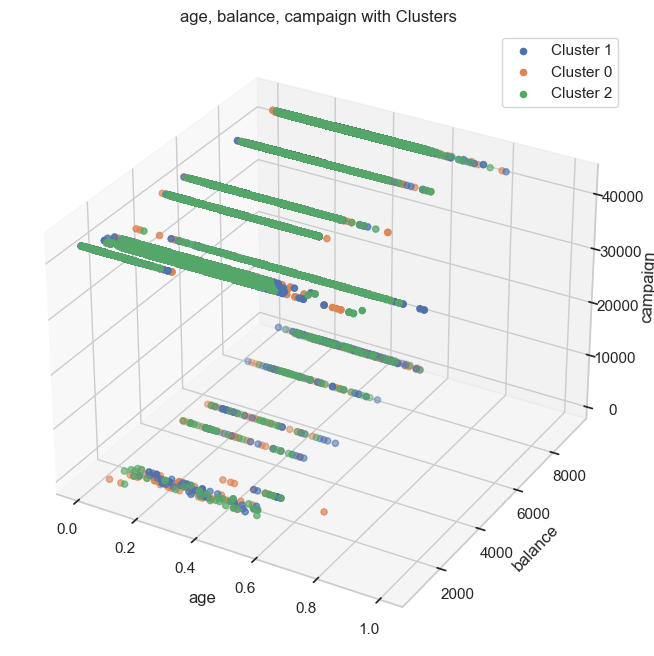

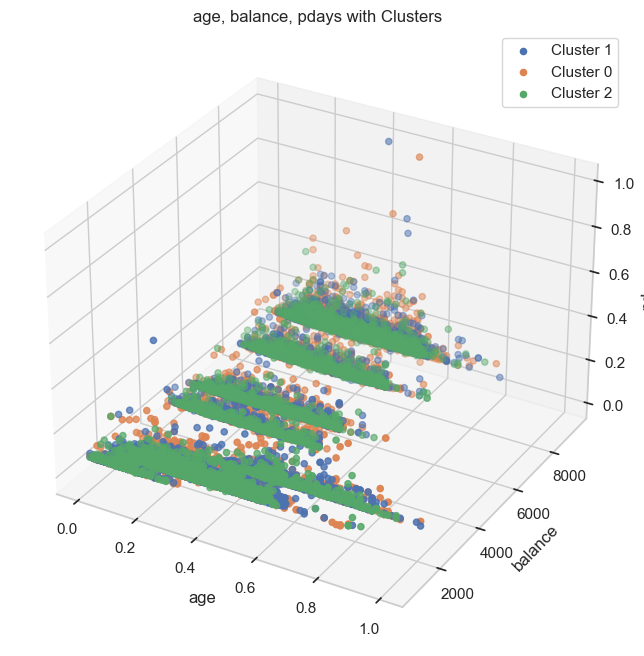

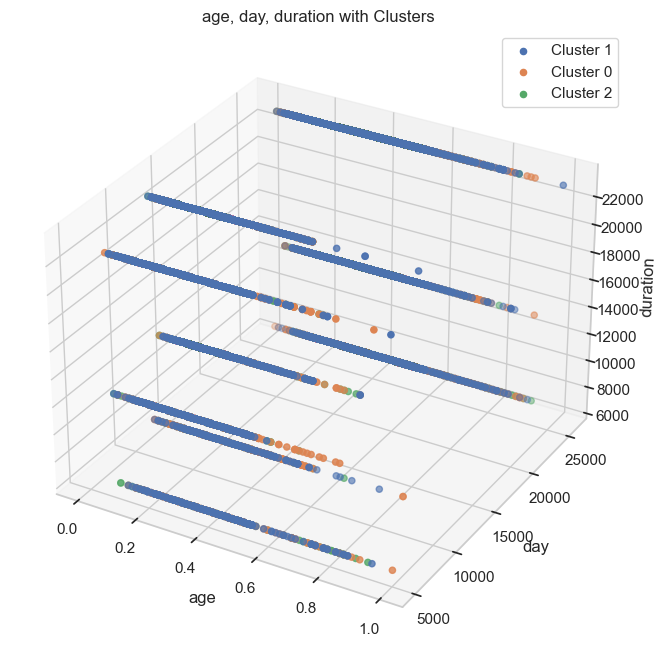

...

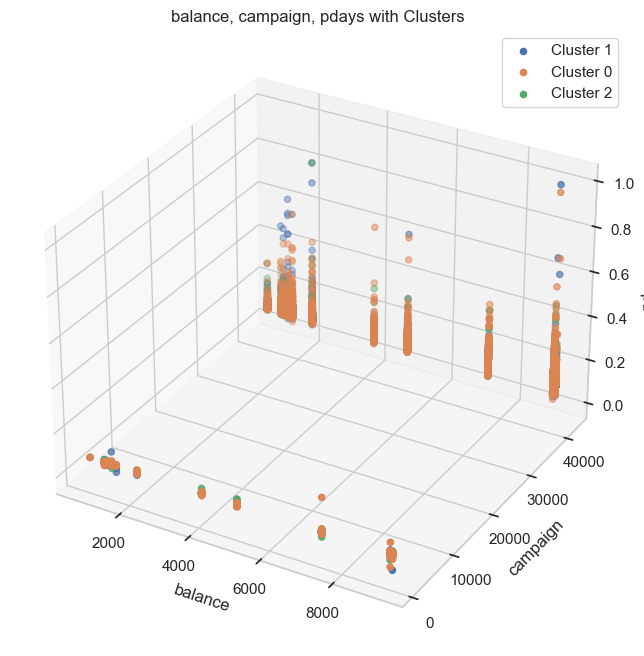

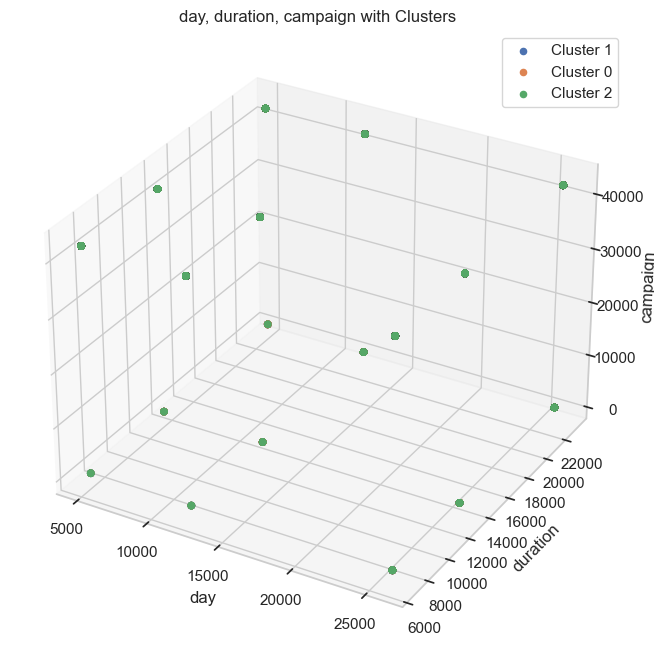

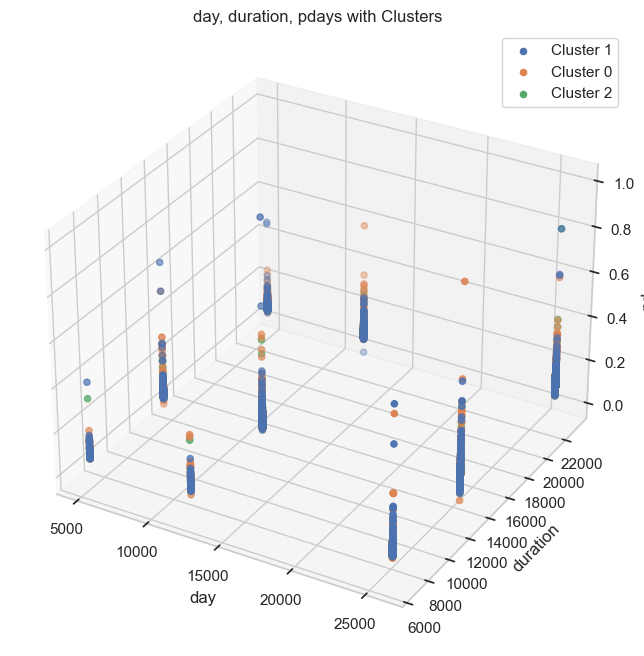

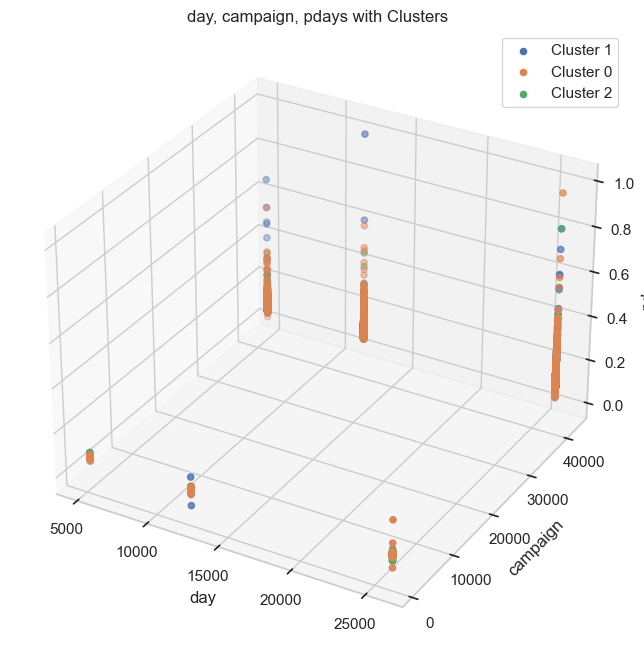

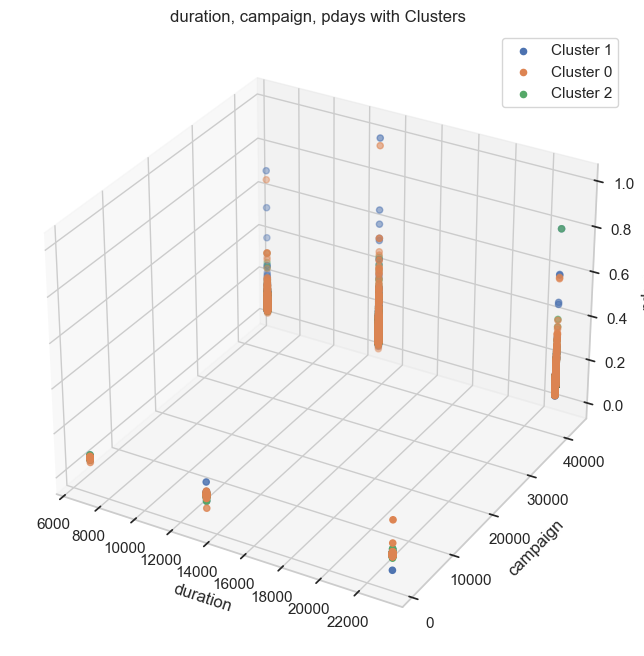

In [52]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# انتخاب سه متغیر از numerical_cols
selected_numerical_cols = numerical_cols[:6]

# Apply K-Means clustering algorithm
kmeans = KMeans(n_clusters=3)  # تعداد خوشه‌ها را می‌توانید تغییر دهید
kmeans.fit(df[selected_numerical_cols])  # df: داده‌هایتان

# Get the cluster labels
labels = kmeans.labels_

# Add the cluster labels to the DataFrame
df['cluster'] = labels

# Plot 3D scatter plots for all features with cluster labels
for i in range(len(selected_numerical_cols)):
    for j in range(i+1, len(selected_numerical_cols)):
        for k in range(j+1, len(selected_numerical_cols)):
            fig = plt.figure(figsize=(10, 8))
            ax = fig.add_subplot(111, projection='3d')
            
            for cluster in df['cluster'].unique():
                cluster_df = df[df['cluster'] == cluster]
                x = cluster_df.iloc[:, i]
                y = cluster_df.iloc[:, j]
                z = cluster_df.iloc[:, k]
                
                ax.scatter(x, y, z, label=f'Cluster {cluster}')

            # Set labels and title
            ax.set_xlabel(selected_numerical_cols[i])
            ax.set_ylabel(selected_numerical_cols[j])
            ax.set_zlabel(selected_numerical_cols[k])
            ax.set_title(f'{selected_numerical_cols[i]}, {selected_numerical_cols[j]}, {selected_numerical_cols[k]} with Clusters')
            ax.legend()

            plt.show()


# Logestic Regresion Model

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, precision_score

# Define features and target variable
X = df.drop(columns=['y'])  # Features
y = df['y']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.8864451904155574
